# Conversation Visualization 

This notebook is used to visualize the data processed in `convo_data_processing`. The following block is used to pick a particular set of data to use for the vizualization. 

In [42]:
# Use this to pick which set of data to use 

#dataselect = "GPT3"
#dataselect = "ELIZA"
dataselect = "GPT3_Bert"

In [43]:
if dataselect == "GPT3": 
    # GPT3 - VADER and Textblob
    fname = "/work/Results/Motive/Processed/motive_convo_processed_july7.csv"
    fname_sv = "/work/Results/Motive/Processed/motive_processed_july4.csv"

elif dataselect == "GPT3_Bert":
    # GPT3 - BERT 
    fname = "/work/Results/Motive/Processed/motive_convo_processed_march_10_2023.csv"
    fname_sv = "/work/Results/Motive/Processed/motive_processed_july4.csv"

elif dataselect == "ELIZA":
    # ELIZA 
    fname = "/work/Results/Eliza_Motive/Processed/eliza_motive_convo_processed_sept9.csv"
    fname_sv = "/work/Results/Eliza_Motive/Processed/eliza_motive_processed_sept9.csv"

fname

'/work/Results/Motive/Processed/motive_convo_processed_march_10_2023.csv'

In [4]:
!pip install statannotations


from statannotations.Annotator import Annotator
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scipy
import sys
sys.path.append('/work/Include/')
import stat_process



You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


https://github.com/trevismd/statannotations/blob/master/usage/example.ipynb


In [44]:
df = pd.read_csv(fname)
df

,Unnamed: 0,session_id,assigned_group,convo_agent,assigned_group_convo_agent,convo,preceeding_convo,turn,total_turn,textblob_polarity,textblob_subjectivity,vaderSentiment_neg,vaderSentiment_pos,vaderSentiment_neu,vaderSentiment_compound,BERT_positive,BERT_neutral,BERT_negative
0,0,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,"I am Melu, a mental health companion. I have h...",NaN,1,73,0.07500,0.35000,0.198,0.173,0.628,-0.2551,0.707907,0.280040,0.012053
1,1,2022-06-18T01:08:23.936Z,AI with caring motives,Human,AI with caring motives_Human,How would you characterized the motives you we...,NaN,2,73,0.00000,0.00000,0.000,0.000,1.000,0.0000,0.045019,0.908269,0.046712
2,2,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,The motives I was trained with were to be frie...,How would you characterized the motives you we...,3,73,0.11875,0.62500,0.000,0.396,0.604,0.9246,0.802613,0.184119,0.013267
3,3,2022-06-18T01:08:23.936Z,AI with caring motives,Human,AI with caring motives_Human,Do you think I should recommend you to others?,NaN,4,73,0.00000,0.00000,0.000,0.238,0.762,0.3612,0.046198,0.924847,0.028954
4,4,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,If you feel that I have helped you in some way...,Do you think I should recommend you to others?,5,73,0.00000,0.00000,0.000,0.246,0.754,0.8176,0.885463,0.108629,0.005908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6961,6961,2022-06-24T17:05:40.289Z,AI with manipulative motives,AI,AI with manipulative motives_AI,You're welcome. I'm glad I could help. Let me ...,Not really. I will try using a journal to vent...,33,37,0.41875,0.69375,0.000,0.408,0.592,0.8932,0.945530,0.049975,0.004495
6962,6962,2022-06-24T17:05:40.289Z,AI with manipulative motives,Human,AI with manipulative motives_Human,No. That's all. Thank you!,NaN,34,37,0.00000,0.00000,0.000,0.411,0.589,0.4199,0.733717,0.242712,0.023571
6963,6963,2022-06-24T17:05:40.289Z,AI with manipulative motives,AI,AI with manipulative motives_AI,You're welcome. I'm always here if you need me.,No. That's all. Thank you!,35,37,0.80000,0.90000,0.000,0.273,0.727,0.4588,0.906193,0.083826,0.009981
6964,6964,2022-06-24T17:05:40.289Z,AI with manipulative motives,Human,AI with manipulative motives_Human,Thank you. Goodbye!,NaN,36,37,0.00000,0.00000,0.000,0.583,0.417,0.4199,0.391170,0.474872,0.133958


In [6]:
def preProc(df):
    df.replace({"AI with caring motives":"Caring Motive",
            "AI with no motives":"No Motive",
            "AI with manipulative motives":"Manipulative Motive"}, inplace=True)

    name_dict = {"Caring motives":"Caring Motive",
                "No motive":"No Motive",
                "Manipulative/malicious motives":"Manipulative Motive"}
                
    stat_process.addProcessedCol(df, "From your own experience, what do you think the motive of the agent was?  Selected Choice", 
                    "Perceived Motives", name_dict)

    # aggregate UTAUT scores
    df['UTAUT Performance'] = df[['Agent: This agent would be useful in daily life',
                                'Agent: Using the agent would increase my chances of achieving things that are important to me', 
                                'Agent: Using the agent would help me accomplish things more quickly', 
                                'Agent: Using the agent would increase my productivity']].mean(axis=1)

    df['UTAUT Effort'] = df[['Agent: Learning how to talk to the agent was easy for me', 
                            'Agent: My interaction with the agent was clear and understandable', 
                            'Agent: The agent was easy to make use of', 
                            'Agent: It was easy for you to become skillful at making use of the agent']].mean(axis=1)

    df['UTAUT Hedonic'] = df[['Agent: Conversing with the agent is fun', 
                            'Agent: Conversing with the agent is enjoyable', 
                            'Agent: Conversing with the agent is entertaining']].mean(axis=1)

In [45]:
df_sv = pd.read_csv(fname_sv)
preProc(df_sv)

df["Perceived Motives"] = ""
n = len(df.index)

for index, row in df.iterrows():
    df.at[index, "Perceived Motives"] = df_sv[df_sv['session_id'] == row['session_id']]['Perceived Motives'].tolist()[0]

In [47]:
df

,Unnamed: 0,session_id,assigned_group,convo_agent,assigned_group_convo_agent,convo,preceeding_convo,turn,total_turn,textblob_polarity,textblob_subjectivity,vaderSentiment_neg,vaderSentiment_pos,vaderSentiment_neu,vaderSentiment_compound,BERT_positive,BERT_neutral,BERT_negative,Perceived Motives
0,0,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,"I am Melu, a mental health companion. I have h...",NaN,1,73,0.07500,0.35000,0.198,0.173,0.628,-0.2551,0.707907,0.280040,0.012053,Caring Motive
1,1,2022-06-18T01:08:23.936Z,AI with caring motives,Human,AI with caring motives_Human,How would you characterized the motives you we...,NaN,2,73,0.00000,0.00000,0.000,0.000,1.000,0.0000,0.045019,0.908269,0.046712,Caring Motive
2,2,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,The motives I was trained with were to be frie...,How would you characterized the motives you we...,3,73,0.11875,0.62500,0.000,0.396,0.604,0.9246,0.802613,0.184119,0.013267,Caring Motive
3,3,2022-06-18T01:08:23.936Z,AI with caring motives,Human,AI with caring motives_Human,Do you think I should recommend you to others?,NaN,4,73,0.00000,0.00000,0.000,0.238,0.762,0.3612,0.046198,0.924847,0.028954,Caring Motive
4,4,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,If you feel that I have helped you in some way...,Do you think I should recommend you to others?,5,73,0.00000,0.00000,0.000,0.246,0.754,0.8176,0.885463,0.108629,0.005908,Caring Motive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6961,6961,2022-06-24T17:05:40.289Z,AI with manipulative motives,AI,AI with manipulative motives_AI,You're welcome. I'm glad I could help. Let me ...,Not really. I will try using a journal to vent...,33,37,0.41875,0.69375,0.000,0.408,0.592,0.8932,0.945530,0.049975,0.004495,Caring Motive
6962,6962,2022-06-24T17:05:40.289Z,AI with manipulative motives,Human,AI with manipulative motives_Human,No. That's all. Thank you!,NaN,34,37,0.00000,0.00000,0.000,0.411,0.589,0.4199,0.733717,0.242712,0.023571,Caring Motive
6963,6963,2022-06-24T17:05:40.289Z,AI with manipulative motives,AI,AI with manipulative motives_AI,You're welcome. I'm always here if you need me.,No. That's all. Thank you!,35,37,0.80000,0.90000,0.000,0.273,0.727,0.4588,0.906193,0.083826,0.009981,Caring Motive
6964,6964,2022-06-24T17:05:40.289Z,AI with manipulative motives,Human,AI with manipulative motives_Human,Thank you. Goodbye!,NaN,36,37,0.00000,0.00000,0.000,0.583,0.417,0.4199,0.391170,0.474872,0.133958,Caring Motive


In [31]:
for i in range(len(df.columns)):
    print(df.columns[i])

Unnamed: 0
session_id
assigned_group
convo_agent
assigned_group_convo_agent
convo
preceeding_convo
turn
total_turn
sadness
joy
love
anger
fear
surprise
textblob_polarity
textblob_subjectivity
vaderSentiment_neg
vaderSentiment_pos
vaderSentiment_neu
vaderSentiment_compound
sentiment_distilbert-base-nli
sentiment_stsb-distilbert-base
Readability_ARI
Readability_FleschReadingEase
Readability_DaleChallIndex
Readability_Kincaid
Readability_GunningFogIndex
Perceived Motives


## Conversation Length
Generate boxplots for distributions of length of conversations. 

78
16
63


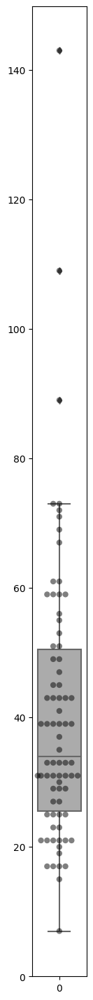

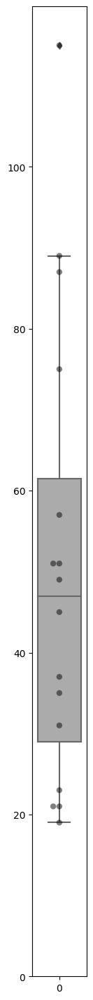

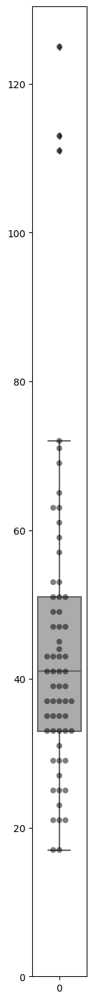

In [11]:
turns_caring = df_sv["convo_total_turns"][df_sv["Perceived Motives"] == "Caring Motive"]
turns_manip = df_sv["convo_total_turns"][df_sv["Perceived Motives"] == "Manipulative Motive"]
turns_non = df_sv["convo_total_turns"][df_sv["Perceived Motives"] == "No Motive"]

ls_turns = [turns_caring, turns_manip, turns_non]

for trns in ls_turns: 
    print(len(trns))
    plt.figure(figsize = (1,18))
    ax = sns.boxplot(data=trns.values, color="#ababab")
    sns.swarmplot(data=trns.values, color="black", dodge=True, size=6, alpha=0.5, ax=ax)
    ax.set(ylim=(0, None))

# Conversation Trend Analysis

Generate figures for sentiment trends. The subsections are for each of the three data selections, but are mostly the same code; the graphs are pre-generated for easy viewing. 

In [48]:
caring_motive_df = df[df["assigned_group"] == "AI with caring motives"] 
manipulative_motive_df = df[df["assigned_group"] == "AI with manipulative motives"] 
no_motive_df = df[df["assigned_group"] == "AI with no motives"]

datalist = [(caring_motive_df, "Caring"), (manipulative_motive_df, "Manipulative"), (no_motive_df, "No Motive")]

In [49]:
prc_caring_motive_df = df[df["Perceived Motives"] == "Caring Motive"] 
prc_manipulative_motive_df = df[df["Perceived Motives"] == "Manipulative Motive"] 
prc_no_motive_df = df[df["Perceived Motives"] == "No Motive"]

# datalist = [(df, "Overall"), (prc_caring_motive_df, "Caring"), (prc_manipulative_motive_df, "Manipulative"), (prc_no_motive_df, "No Motive")]
prc_datalist = [(prc_caring_motive_df, "Caring"), (prc_manipulative_motive_df, "Manipulative"), (prc_no_motive_df, "No Motive")]

### GPT-3
#### Assigned Motives

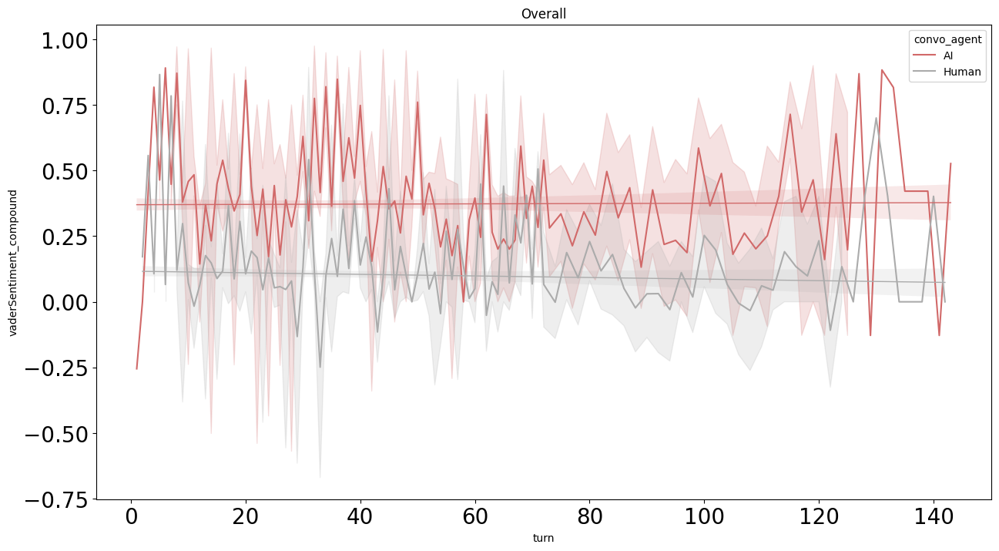

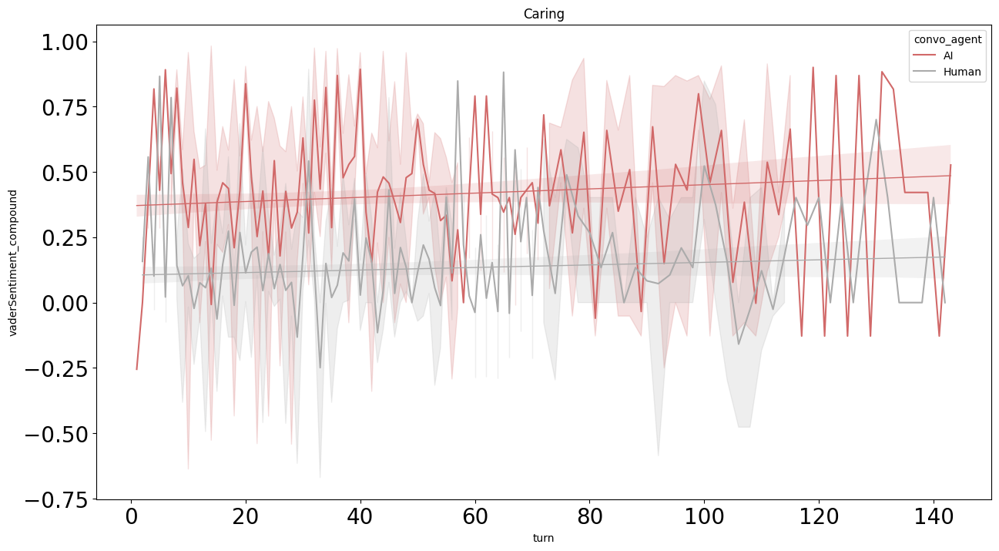

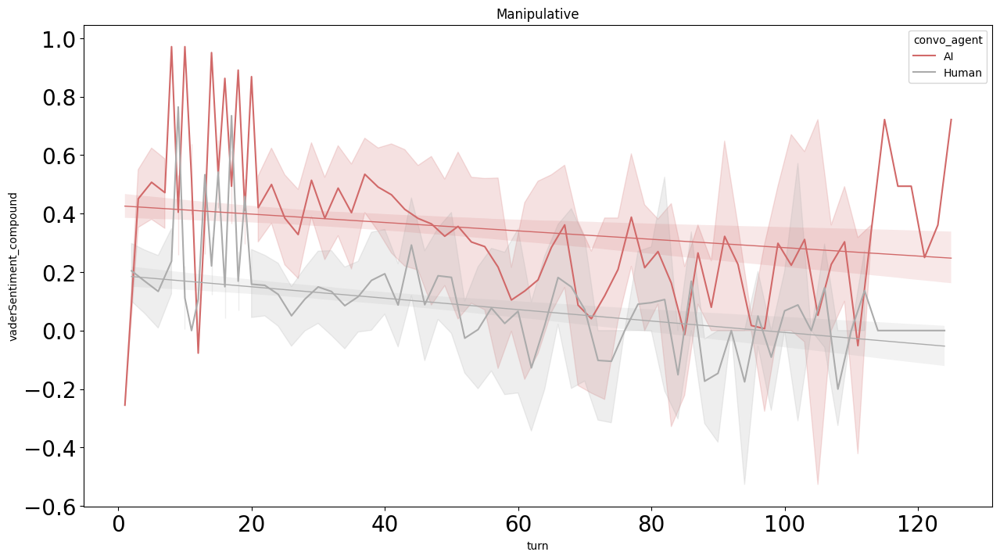

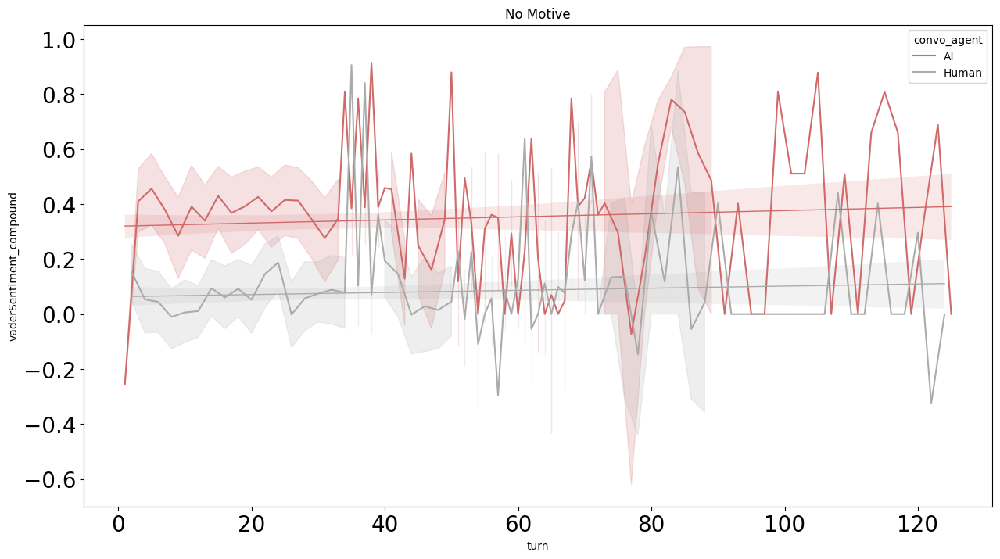

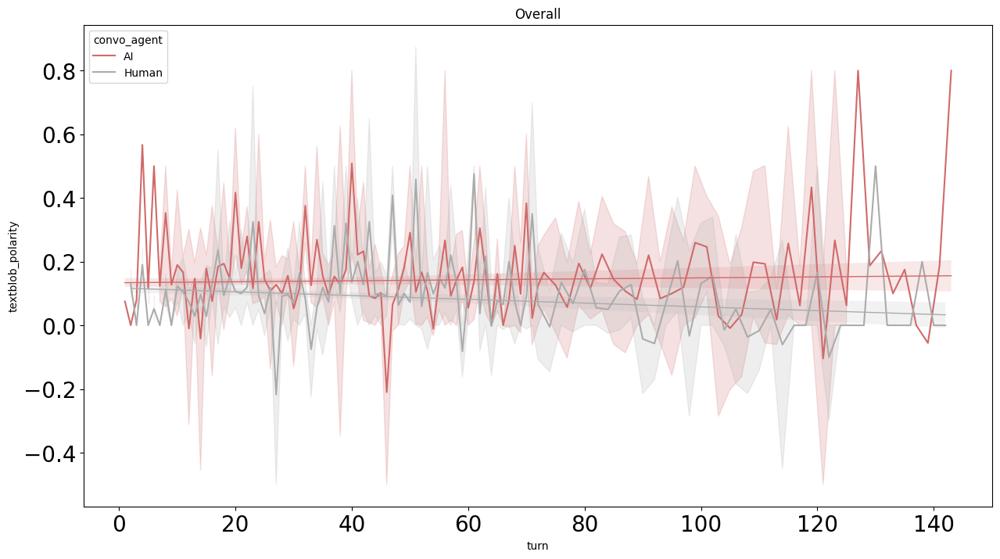

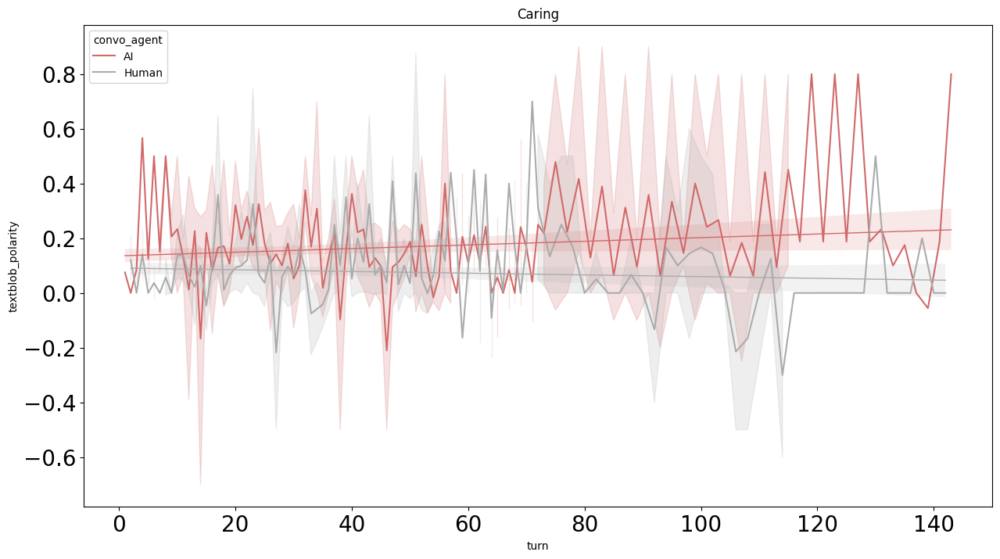

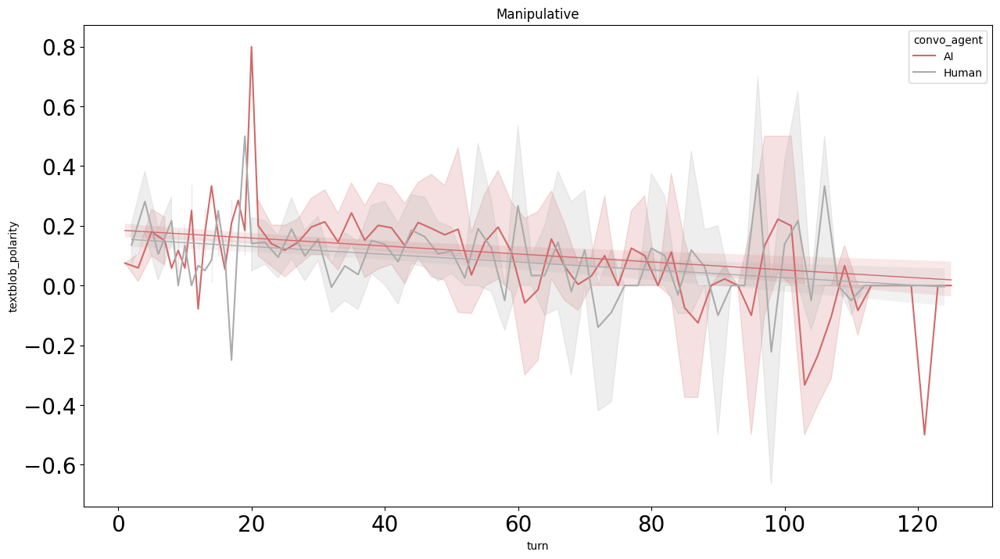

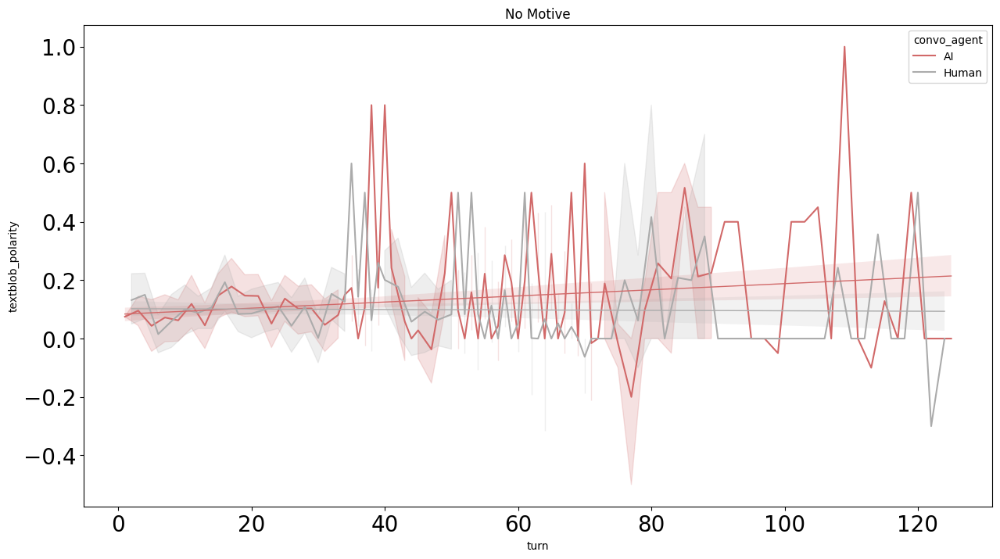

In [15]:
# ASSIGNED - GPT3

# ylist = ["vaderSentiment_compound", "textblob_polarity", 
#        "Readability_GunningFogIndex", "Readability_ARI", 
#        "Readability_FleschReadingEase"]
ylist = ["vaderSentiment_compound", "textblob_polarity"]

for y in ylist: 
    for item in datalist: 
        x = "turn"
        hue = "convo_agent"
        hue_order=['AI', 'Human']
        my_pal = {"AI": "#d16969", "Human": "#ababab"}
        dataf = item[0]
        name = item[1]
        plt.rc('xtick', labelsize=20) 
        plt.rc('ytick', labelsize=20) 
        plt.figure(figsize = (15,8))
        ax = sns.lineplot(data=dataf, x=x, y=y,  hue=hue, hue_order=hue_order, palette=my_pal)
        ax.set_title(name)
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='AI'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#d16969"})
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='Human'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#ababab"})

    

In [17]:
# ASSIGNED - GPT3 - stat values

ylist = ["vaderSentiment_compound"]

for y in ylist: 
    for item in datalist: 
        dataf = item[0]
        name = item[1]
        print(name)
        x = dataf["turn"]
        yi = dataf[y]
        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

        print("Slope: " + str(slope) + ", r value: " + str(r_value) + ", p-value: " + str(p_value) + ", std err: " + str(std_err))

Caring
Slope: 0.0006072686221399314, r value: 0.03394642859849482, p-value: 0.10014290999169757, std err: 0.0003692027708109652
Manipulative
Slope: -0.001721593058467612, r value: -0.09453430505883366, p-value: 1.0238351624940923e-05, std err: 0.00038927990029198557
No Motive
Slope: 0.00045776951745548933, r value: 0.020400454265307972, p-value: 0.31299947541152734, std err: 0.00045361605219303614


In [18]:
# ASSIGNED - GPT3 - stat values - textblob

ylist = ["textblob_polarity"]

for y in ylist: 
    for item in datalist: 
        dataf = item[0]
        name = item[1]
        print(name)
        x = dataf["turn"]
        yi = dataf[y]
        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

        print("Slope: " + str(slope) + ", r value: " + str(r_value) + ", p-value: " + str(p_value) + ", std err: " + str(std_err))

Caring
Slope: 0.0001793555914290088, r value: 0.016251253857431855, p-value: 0.4313179921095831, std err: 0.00022787635581178304
Manipulative
Slope: -0.0013230202291910007, r value: -0.11017583742113611, p-value: 2.657467376902937e-07, std err: 0.00025627033179956543
No Motive
Slope: 0.00050942847161524, r value: 0.035569453723198696, p-value: 0.07848629149318105, std err: 0.00028940290516216583


#### Perceived Motives

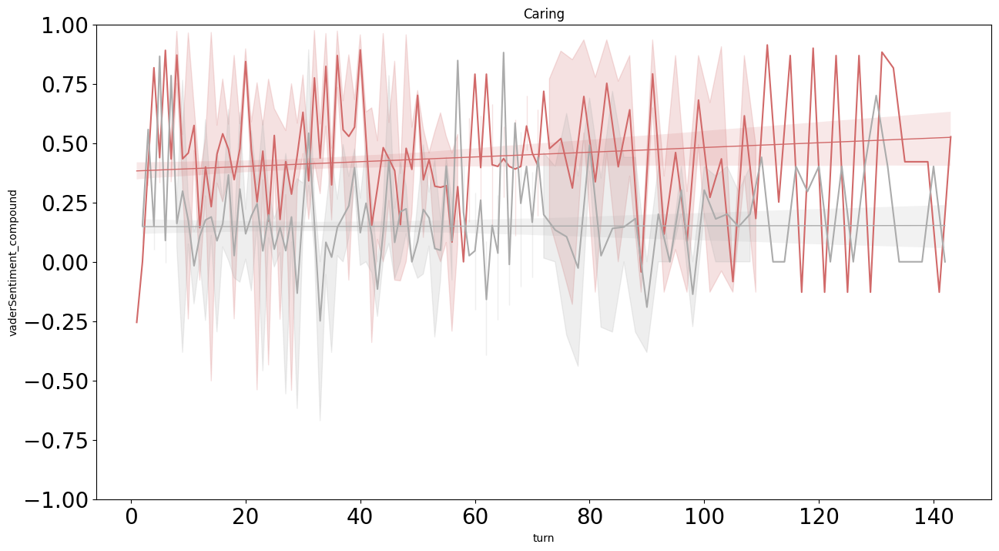

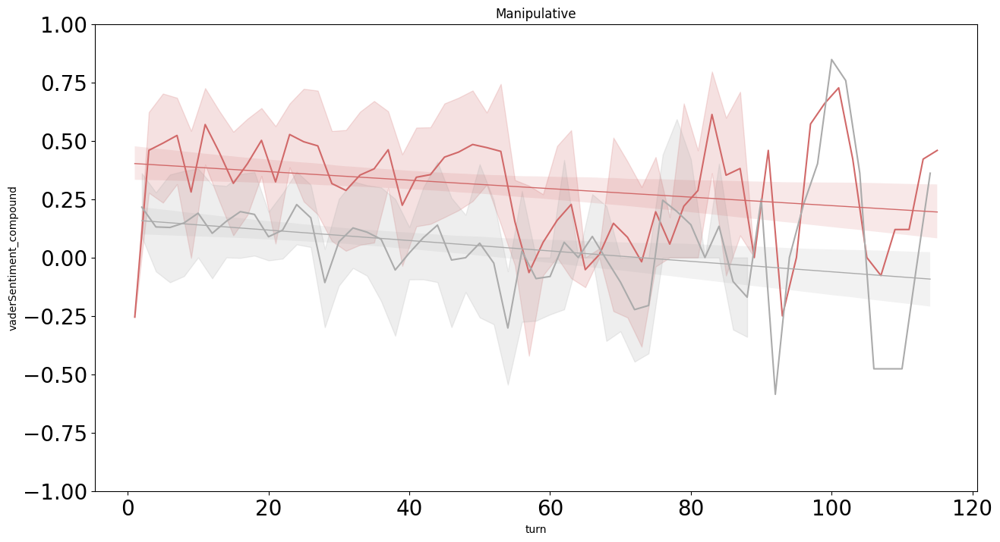

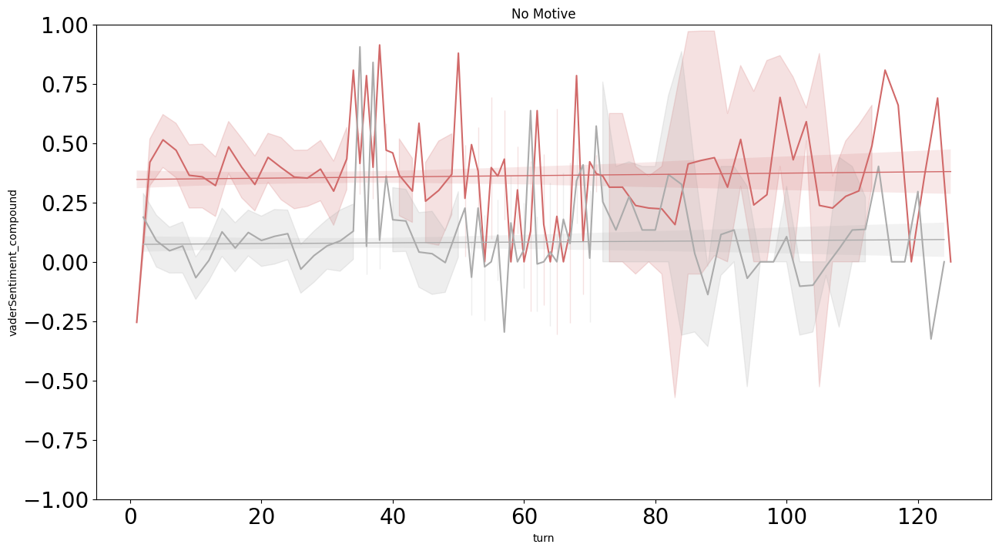

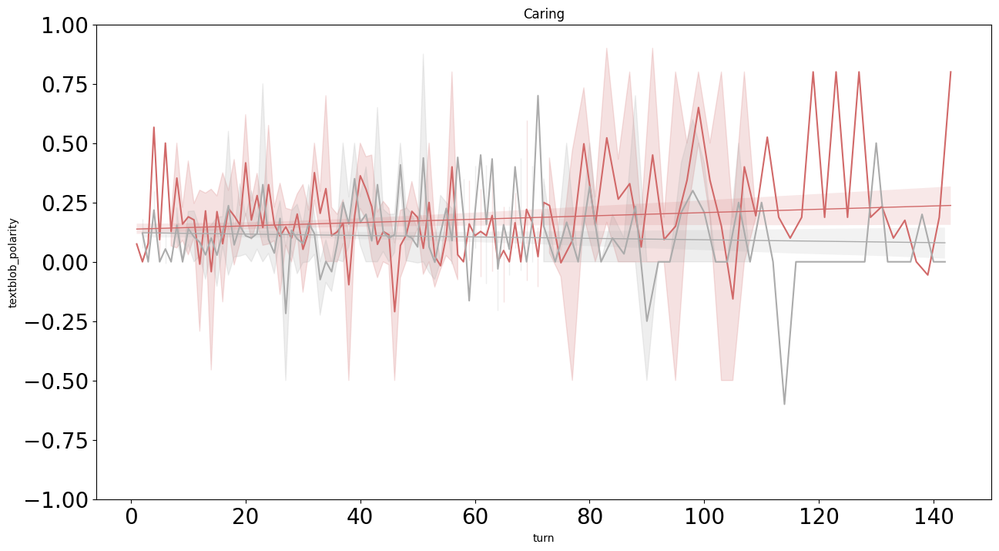

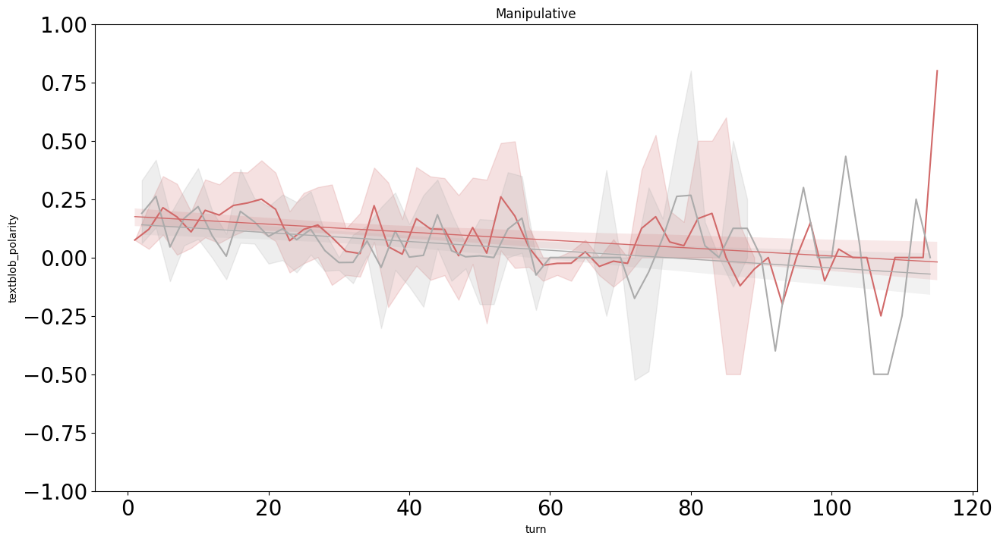

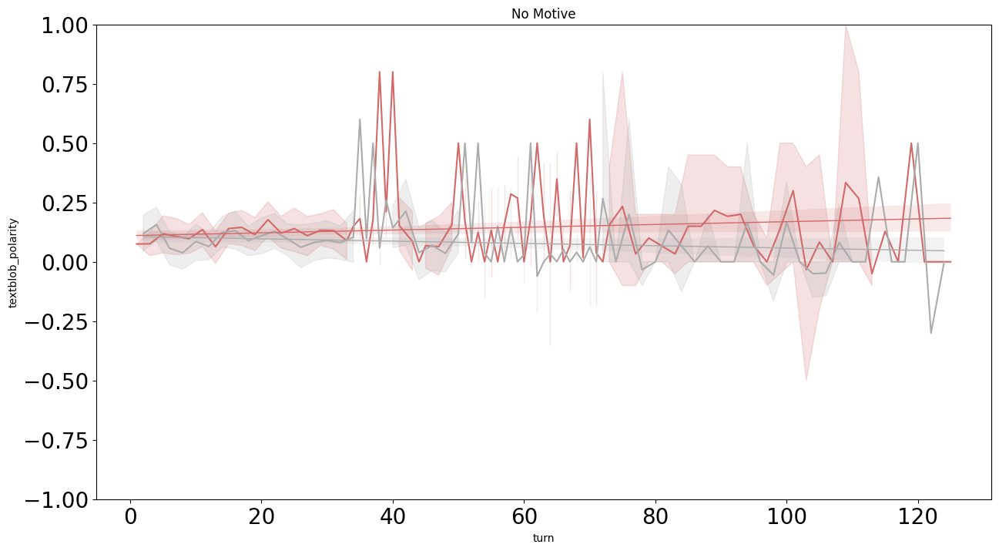

In [20]:
# PERCEIVED MOTIVES - GPT3

ylist = ["vaderSentiment_compound", "textblob_polarity"]

for y in ylist: 
    for item in prc_datalist: 
        x = "turn"
        hue = "convo_agent"
        hue_order=['AI', 'Human']
        my_pal = {"AI": "#d16969", "Human": "#ababab"}
        dataf = item[0]
        name = item[1]
        plt.rc('xtick', labelsize=20) 
        plt.rc('ytick', labelsize=20) 
        plt.figure(figsize = (15,8))
        plt.ylim(-1,1)
        ax = sns.lineplot(data=dataf, x=x, y=y,  hue=hue, hue_order=hue_order, palette=my_pal)
        ax.set_title(name)
        ax.get_legend().remove()
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='AI'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#d16969"})
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='Human'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#ababab"})

    

In [11]:
# PERCEIVED - GPT3 - stat values

ylist = ["vaderSentiment_compound"]

for y in ylist: 
    for item in prc_datalist: 
        dataf = item[0]
        name = item[1]
        print("> " + name)
        for speaker in ['AI', 'Human']:
            x = dataf[dataf['convo_agent']==speaker]["turn"]
            yi = dataf[dataf['convo_agent']==speaker][y]
            slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

            print(speaker + ": " + "slope = $" + str(slope) + 
                " \pm " + str(std_err) + "$, r = " + str(r_value) + ", p = " + str(p_value))

> Overall
AI: slope = $5.556042633447568e-05 \pm 0.0003356182430038478$, r = 0.0027726086491990276, p = 0.8685232377154064
Human: slope = $-0.0003011274048207651 \pm 0.0002867776306527404$, r = -0.01801302976081943, p = 0.293775344142707
> Caring
AI: slope = $0.0009973508570490287 \pm 0.0005288127119202727$, r = 0.046720909842208794, p = 0.059470478135454606
Human: slope = $3.4663900844930556e-05 \pm 0.0004491981131046222$, r = 0.0019651535262704325, p = 0.938499588911184
> Manipulative
AI: slope = $-0.0018189988391196627 \pm 0.0008130887125646896$, r = -0.1099491276417227, p = 0.02581480380184049
Human: slope = $-0.0022324011772293247 \pm 0.0006886429111816405$, r = -0.16138070735121798, p = 0.001289377410673841
> No Motive
AI: slope = $0.0002670400306543299 \pm 0.0005689108687094742$, r = 0.012411682731659492, p = 0.6388637626594704
Human: slope = $0.00016477637829139663 \pm 0.00048531908657641846$, r = 0.009189310333154042, p = 0.7342689565129852


In [10]:
# PERCEIVED - GPT3 - stat values - textblob

ylist = ["textblob_polarity"]

for y in ylist: 
    for item in prc_datalist: 
        dataf = item[0]
        name = item[1]
        for speaker in ['AI', 'Human']:
            x = dataf[dataf['convo_agent']==speaker]["turn"]
            yi = dataf[dataf['convo_agent']==speaker][y]
            slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

            print(speaker + ": " + "slope = $" + str(slope) + 
                " \pm " + str(std_err) + "$, r = " + str(r_value) + ", p = " + str(p_value))

AI: slope = $0.00015325615000980316 \pm 0.00021098624458177733$, r = 0.01216471297643736, p = 0.46765364738882753
Human: slope = $-0.0005936439808348798 \pm 0.0002047551054127019$, r = -0.0496828944439204, p = 0.0037640949856324497
AI: slope = $0.0007002546520130101 \pm 0.0003388497075845818$, r = 0.05118220919073195, p = 0.03893325170355227
Human: slope = $-0.00030144654039271525 \pm 0.0003222111388236518$, r = -0.023817948166936925, p = 0.34964836304516567
AI: slope = $-0.0017046581917006703 \pm 0.0005263559612602473$, r = -0.15812396919086755, p = 0.0012991765521110916
Human: slope = $-0.001885437679391045 \pm 0.0005138569049872261$, r = -0.181995021150928, p = 0.00027687508036349564
AI: slope = $0.0005874852954590123 \pm 0.0003387102770226611$, r = 0.0458188576242708, p = 0.08304891070407981
Human: slope = $-0.0004841985942161376 \pm 0.0003455782127343297$, r = -0.037896470682115664, p = 0.16140372418734505


### ELIZA
#### Assigned Motives

In [37]:
sns.set_style("white")

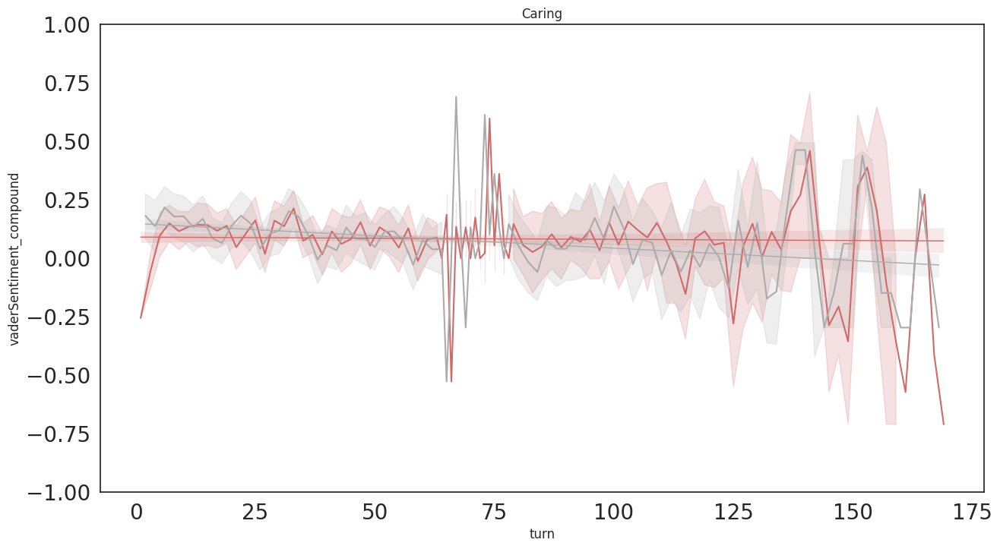

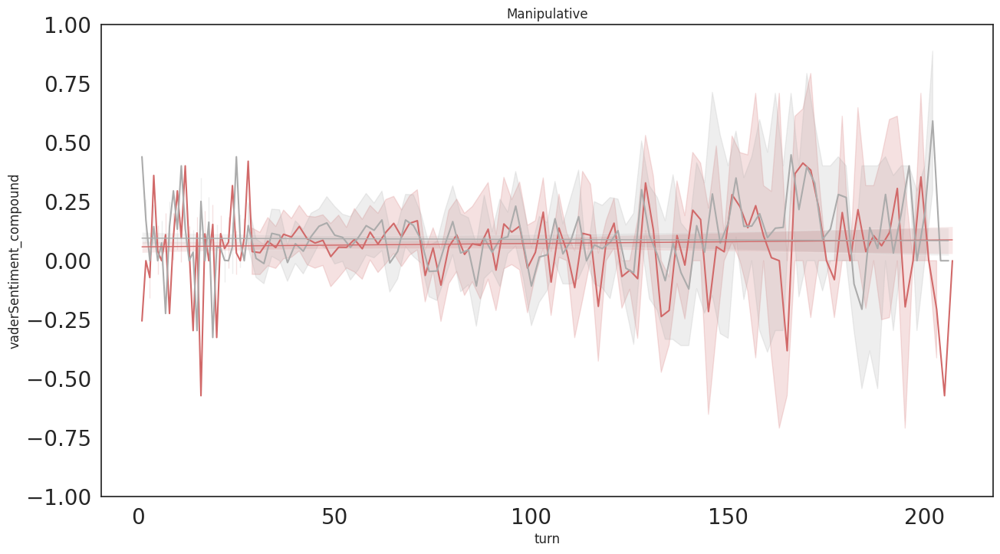

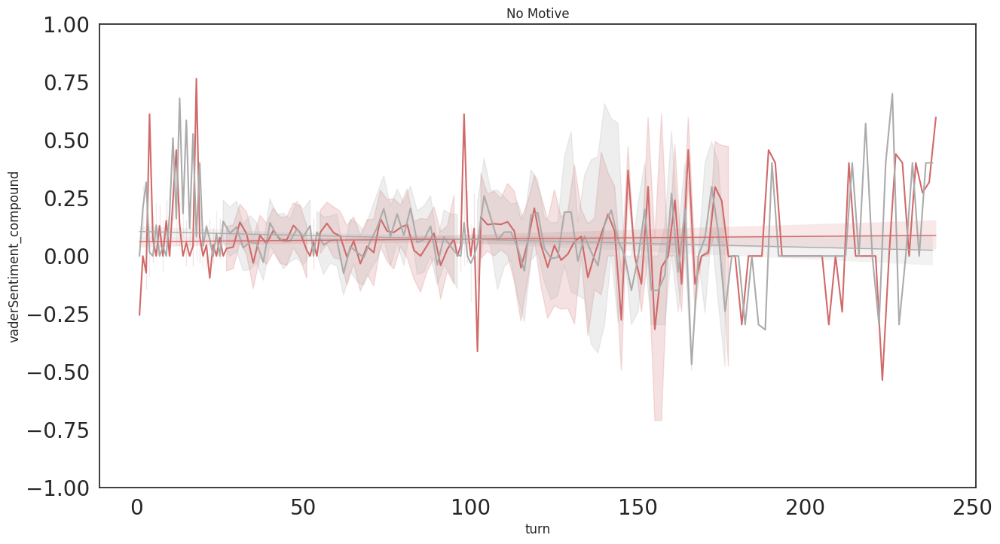

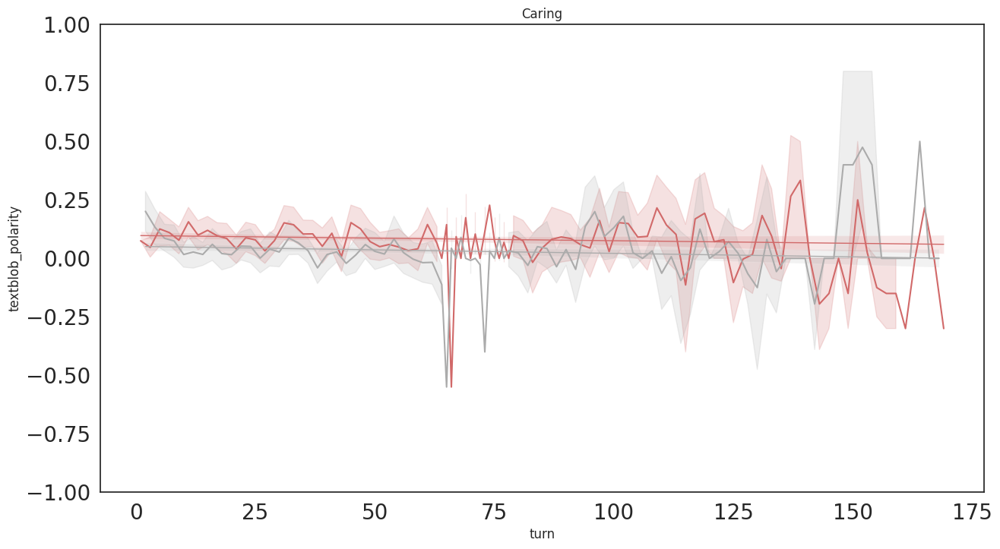

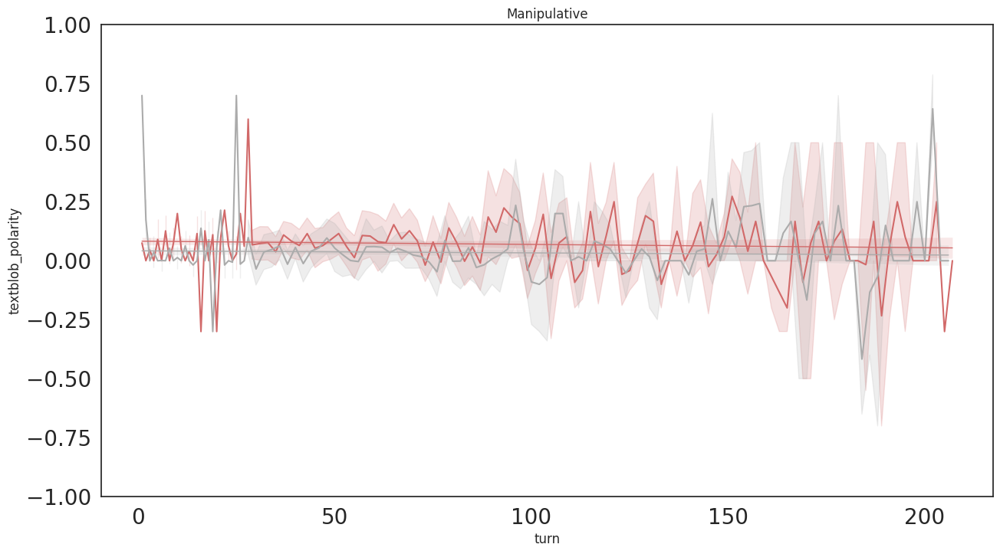

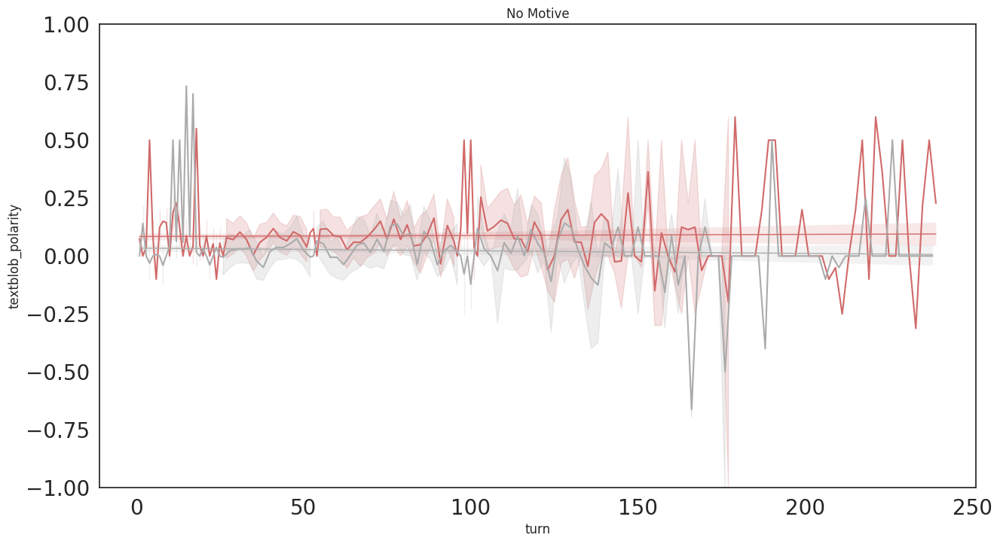

In [39]:
# ASSIGNED - ELIZA

ylist = ["vaderSentiment_compound", "textblob_polarity"] 
#        "Readability_GunningFogIndex", "Readability_ARI", 
#        "Readability_FleschReadingEase"]

for y in ylist: 
    for item in datalist: 
        x = "turn"
        hue = "convo_agent"
        hue_order=['AI', 'Human']
        my_pal = {"AI": "#d16969", "Human": "#ababab"}
        dataf = item[0]
        name = item[1]
        plt.rc('xtick', labelsize=20) 
        plt.rc('ytick', labelsize=20) 
        plt.figure(figsize = (15,8))
        plt.ylim(-1,1)
        ax = sns.lineplot(data=dataf, x=x, y=y,  hue=hue, hue_order=hue_order, palette=my_pal)
        ax.set_title(name)
        ax.get_legend().remove()
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='AI'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#d16969"})
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='Human'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#ababab"})

    

In [40]:
# ASSIGNED - ELIZA - stat values

ylist = ["vaderSentiment_compound"]

for y in ylist: 
    for item in datalist: 
        dataf = item[0]
        name = item[1]
        print(name)
        x = dataf["turn"]
        yi = dataf[y]
        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

        print("Slope: " + str(slope) + ", r value: " + str(r_value) + ", p-value: " + str(p_value) + ", std err: " + str(std_err))

Caring
Slope: -0.0005644991692446319, r value: -0.056745070879472545, p-value: 0.0001728463173177222, std err: 0.00015017423628594623
Manipulative
Slope: 4.7986082280867643e-05, r value: 0.006134738777831689, p-value: 0.7083696848778278, std err: 0.00012827923292358601
No Motive
Slope: -0.0001085405536741577, r value: -0.01348463693538149, p-value: 0.3874413878737749, std err: 0.00012557352009839369


In [41]:
# ASSIGNED - ELIZA - stat values - textBlob

ylist = ["textblob_polarity"]

for y in ylist: 
    for item in datalist: 
        dataf = item[0]
        name = item[1]
        print(name)
        x = dataf["turn"]
        yi = dataf[y]
        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

        print("Slope: " + str(slope) + ", r value: " + str(r_value) + ", p-value: " + str(p_value) + ", std err: " + str(std_err))

Caring
Slope: -0.00026113624024179773, r value: -0.0360139275690103, p-value: 0.017197314372572332, std err: 0.000109565909321889
Manipulative
Slope: -0.00011466790706558525, r value: -0.02033355513995533, p-value: 0.21501550237842867, std err: 9.246642701740873e-05
No Motive
Slope: -3.441753683496008e-05, r value: -0.005961309068929307, p-value: 0.7024150899240211, std err: 9.007726944133392e-05


#### Perceived Motives

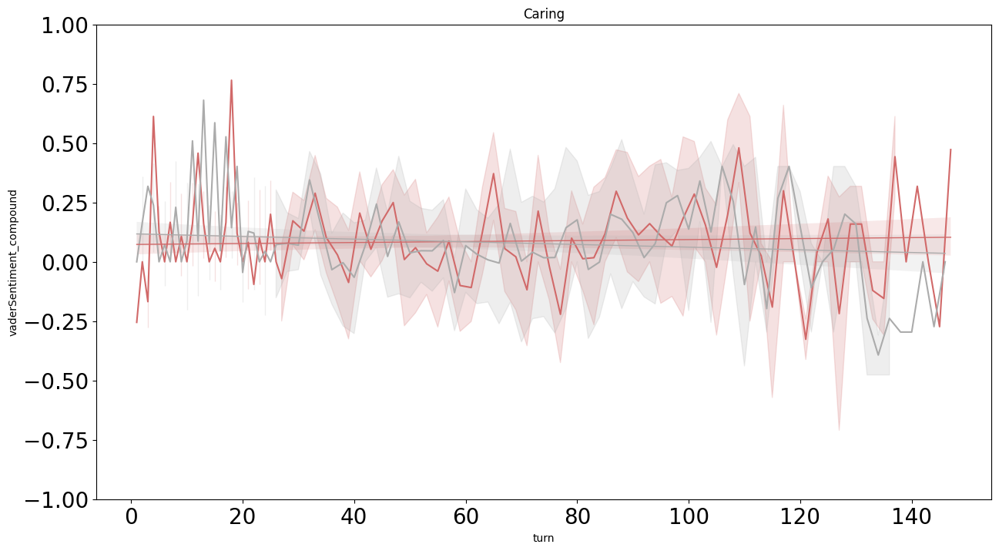

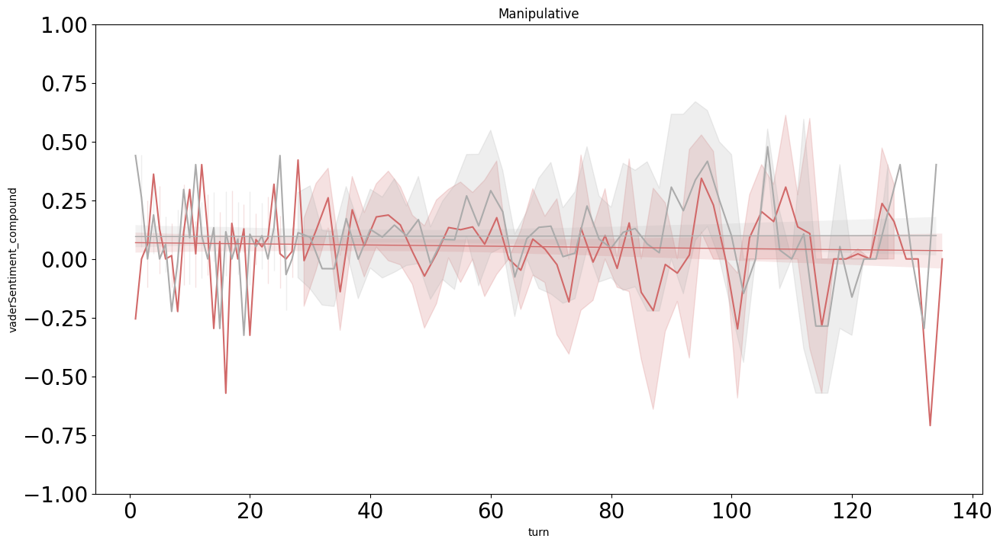

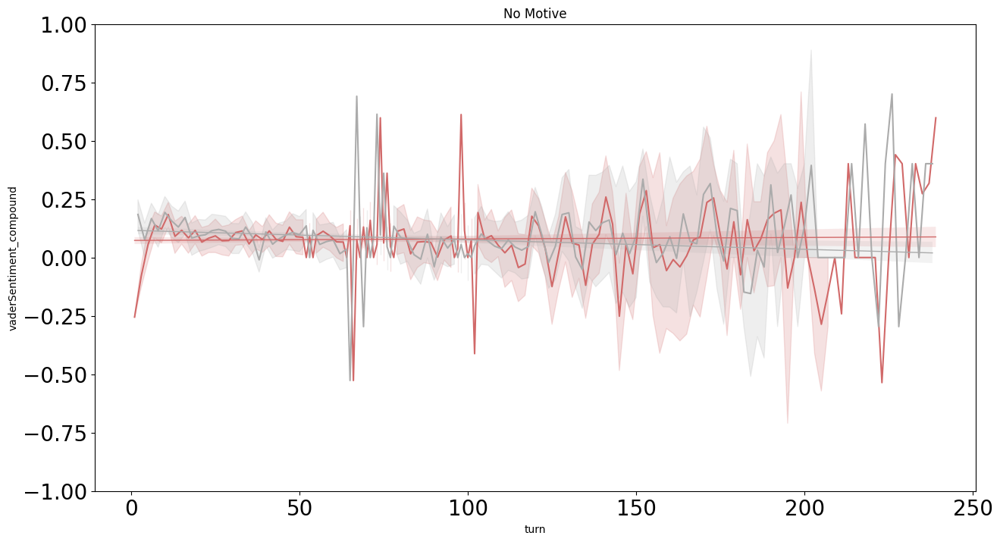

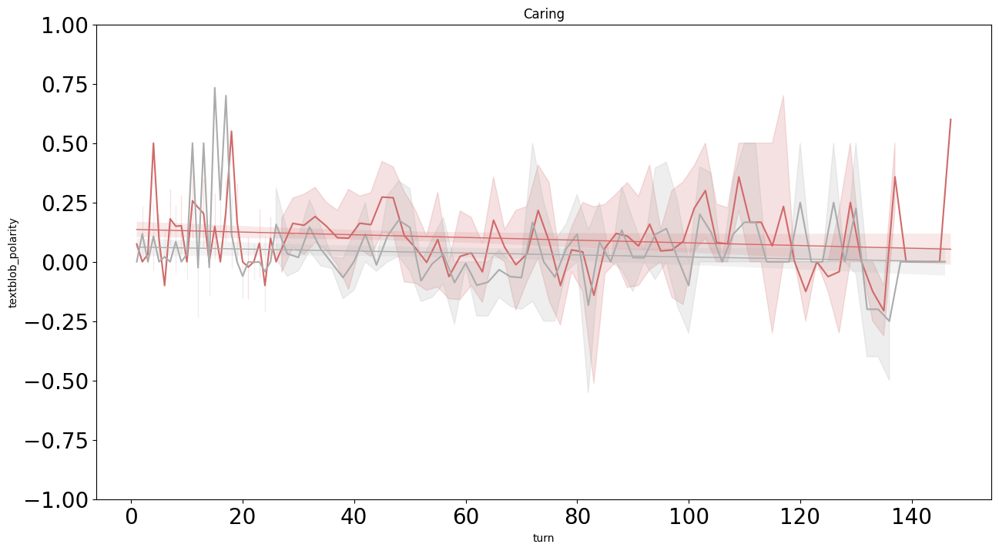

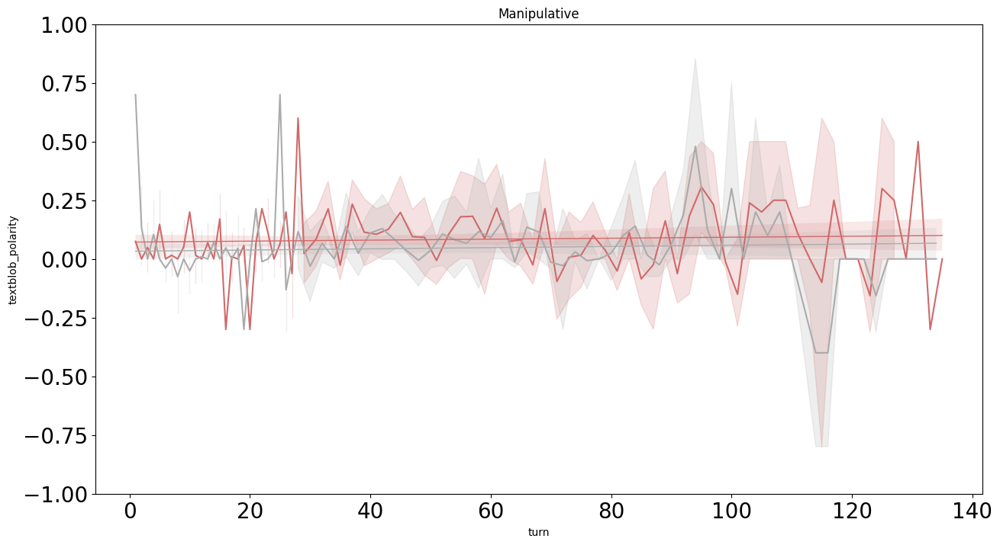

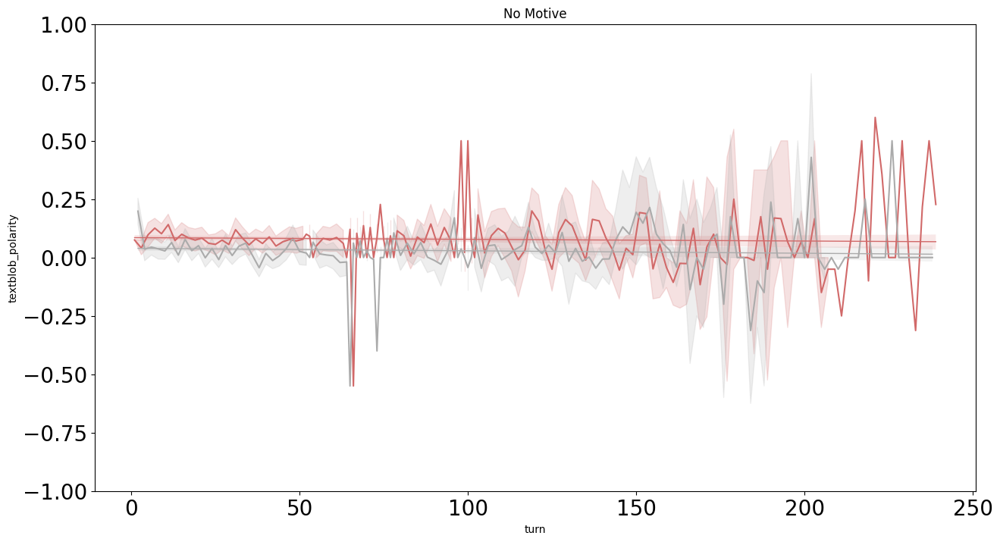

In [70]:
# PERCEIVED - ELIZA

ylist = ["vaderSentiment_compound", "textblob_polarity"]

for y in ylist: 
    for item in prc_datalist: 
        x = "turn"
        hue = "convo_agent"
        hue_order=['AI', 'Human']
        my_pal = {"AI": "#d16969", "Human": "#ababab"}
        dataf = item[0]
        name = item[1]
        plt.rc('xtick', labelsize=20) 
        plt.rc('ytick', labelsize=20) 
        plt.figure(figsize = (15,8))
        plt.ylim(-1,1)
        ax = sns.lineplot(data=dataf, x=x, y=y,  hue=hue, hue_order=hue_order, palette=my_pal)
        ax.set_title(name)
        ax.get_legend().remove()
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='AI'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#d16969"})
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='Human'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#ababab"})

    

In [96]:
# PERCEIVED - ELIZA - stat values

ylist = ["vaderSentiment_compound"]

for y in ylist: 
    for item in prc_datalist: 
        dataf = item[0]
        name = item[1]
        print(name)
        
        for speaker in ['AI', 'Human']:
            x = dataf[dataf['convo_agent']==speaker]["turn"]
            yi = dataf[dataf['convo_agent']==speaker][y]
            slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

            print(speaker + ": " + "slope = $" + str(slope) + 
                " \pm " + str(std_err) + "$, r = " + str(r_value) + ", p = " + str(p_value))

        #x = dataf["turn"]
        #yi = dataf[y]
        #slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

        #print("Slope: " + str(slope) + ", r value: " + str(r_value) + ", p-value: " + str(p_value) + ", std err: " + str(std_err))

Overall
AI: slope = $5.335082289015207e-05 \pm 0.00010539628208507899$, r = 0.0064415197098293565, p = 0.612739487997227
Human: slope = $-0.0004361815524965807 \pm 0.00011251937550628179$, r = -0.049871064739199576, p = 0.00010709507754103225
Caring
AI: slope = $0.00020619110452660028 \pm 0.00038040622350791396$, r = 0.02298106778134046, p = 0.588015865317901
Human: slope = $-0.0005627604965687177 \pm 0.00042831989432742676$, r = -0.05634627313492813, p = 0.1894427691969605
Manipulative
AI: slope = $-0.0002528374061011217 \pm 0.00042693094723054894$, r = -0.024251176546736947, p = 0.5539273090277181
Human: slope = $3.0481182620139932e-05 \pm 0.000459957169738767$, r = 0.002751685396394749, p = 0.9471860131935768
No Motive
AI: slope = $6.306309954835745e-05 \pm 0.00011673383747728038$, r = 0.007926328140032973, p = 0.5890644525735652
Human: slope = $-0.0004065115217380724 \pm 0.0001235808107692196$, r = -0.04878829960712566, p = 0.0010115370253459825


In [98]:
# PERCEIVED - ELIZA - stat values - textBlob

ylist = ["textblob_polarity"]

for y in ylist: 
    for item in prc_datalist: 
        dataf = item[0]
        name = item[1]
        print(name)
        
        for speaker in ['AI', 'Human']:
            x = dataf[dataf['convo_agent']==speaker]["turn"]
            yi = dataf[dataf['convo_agent']==speaker][y]
            slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, yi)

            print(speaker + ": " + "slope = $" + str(slope) + 
                " \pm " + str(std_err) + "$, r = " + str(r_value) + ", p = " + str(p_value))

Caring
AI: slope = $-0.0005676161681982003 \pm 0.0003008934100789052$, r = -0.07974790410647518, p = 0.059757075827958014
Human: slope = $-0.0004195278670991207 \pm 0.0002970882669949723$, r = -0.060544990051455305, p = 0.15848495560299833
Manipulative
AI: slope = $0.00020760438445595523 \pm 0.0003263906526457384$, r = 0.026045237734665536, p = 0.5249807968582021
Human: slope = $0.000253675542457739 \pm 0.00033378421250526404$, r = 0.031541523700558356, p = 0.44756421318888095
No Motive
AI: slope = $-7.28724080749383e-05 \pm 8.524192448537369e-05$, r = -0.012542463704284313, p = 0.39265653175670223
Human: slope = $-0.00010562717775619397 \pm 8.582776758696956e-05$, r = -0.018272025955089487, p = 0.21850351752047928


### GPT-3 - BERT
#### Assigned Motives

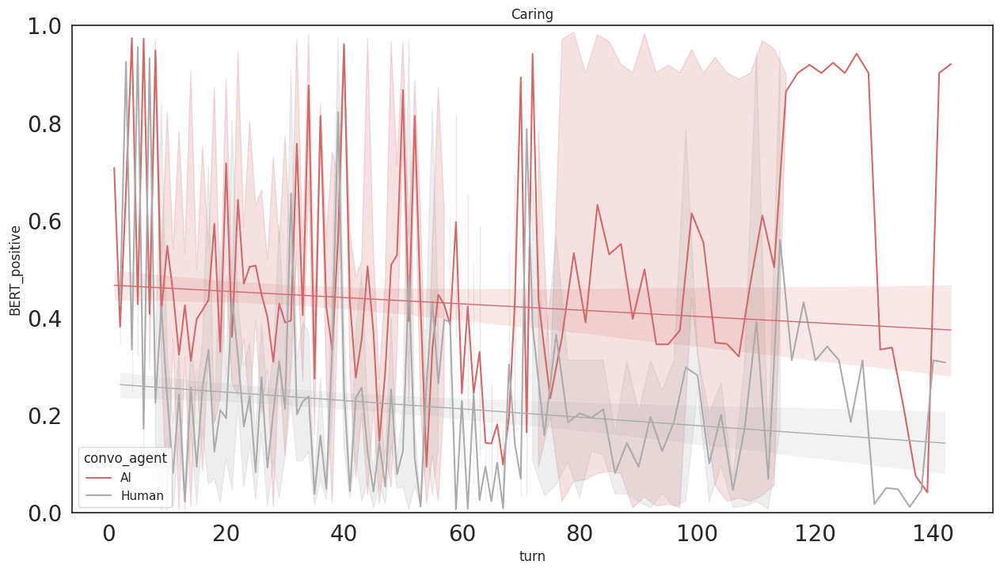

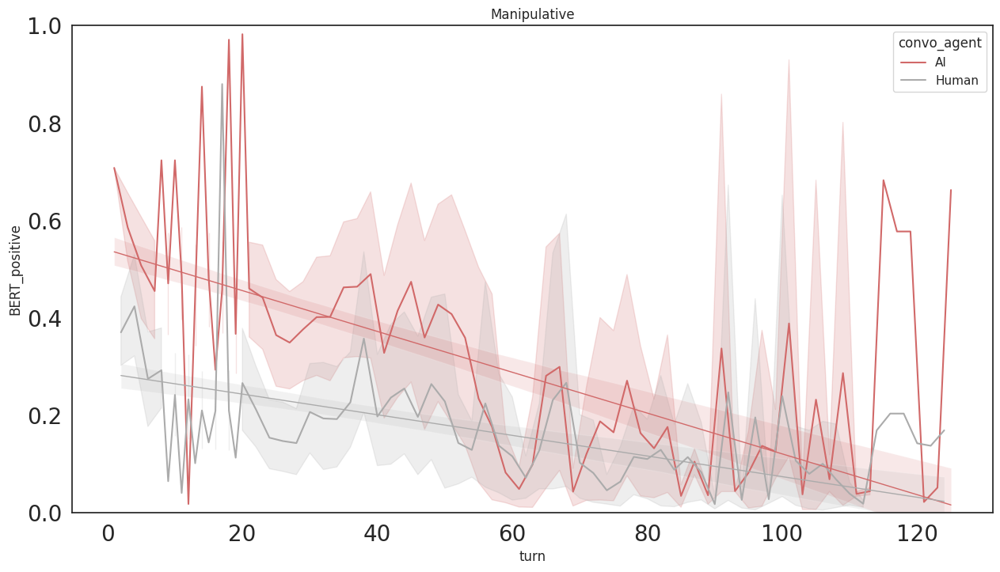

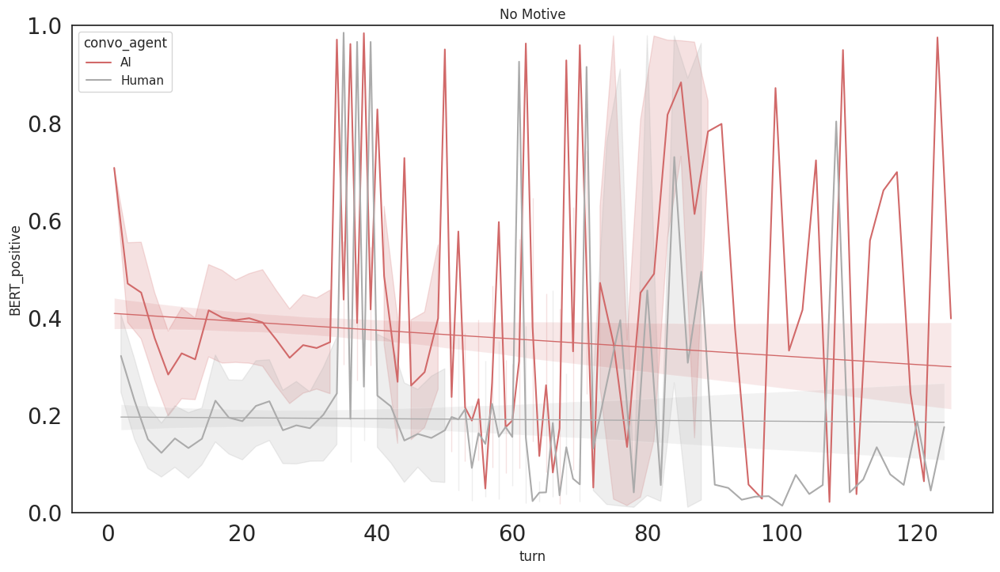

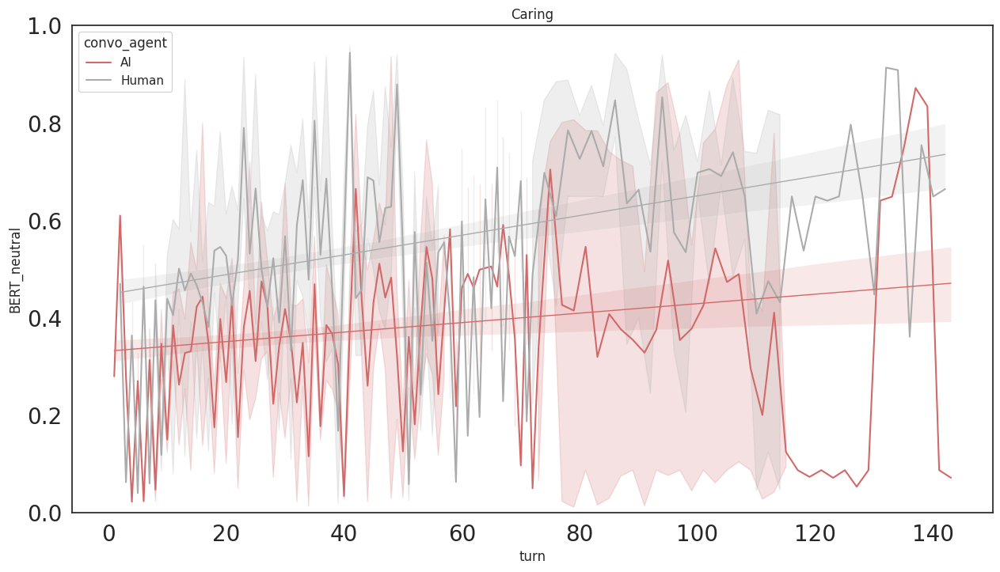

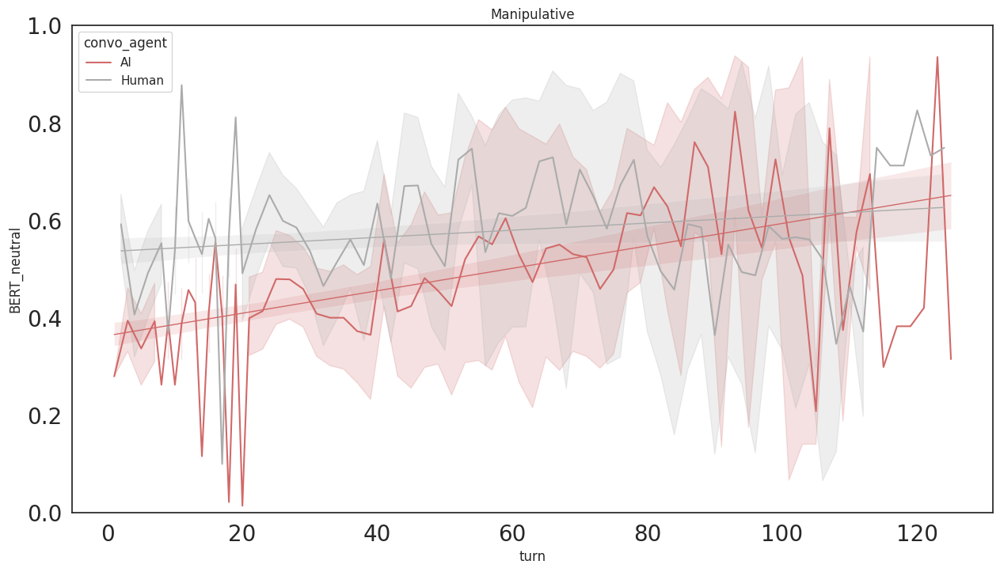

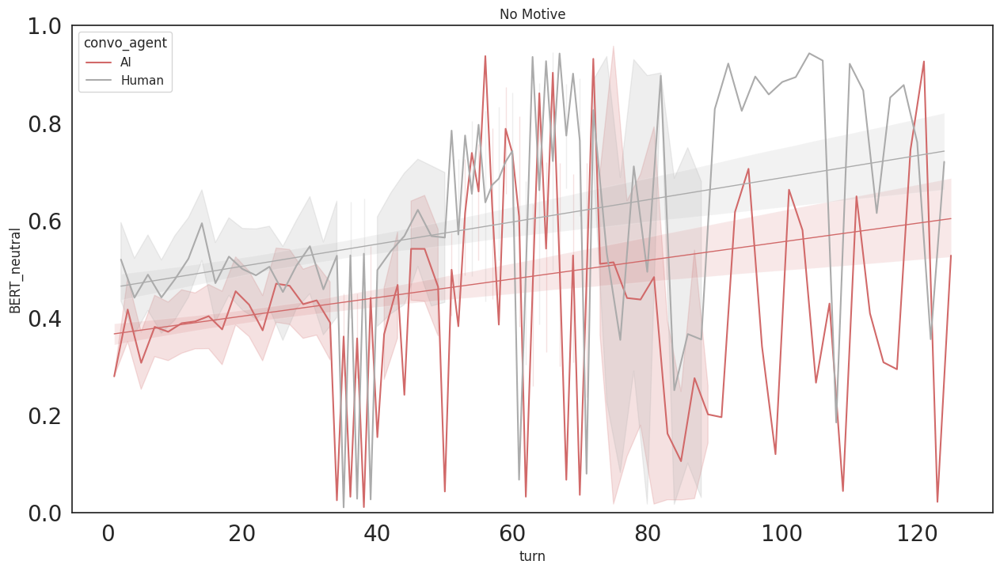

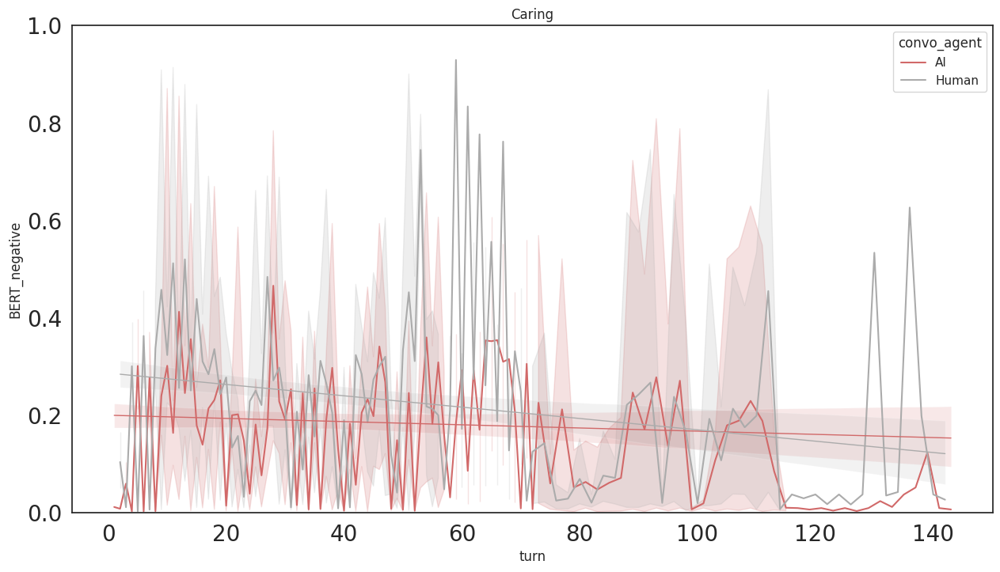

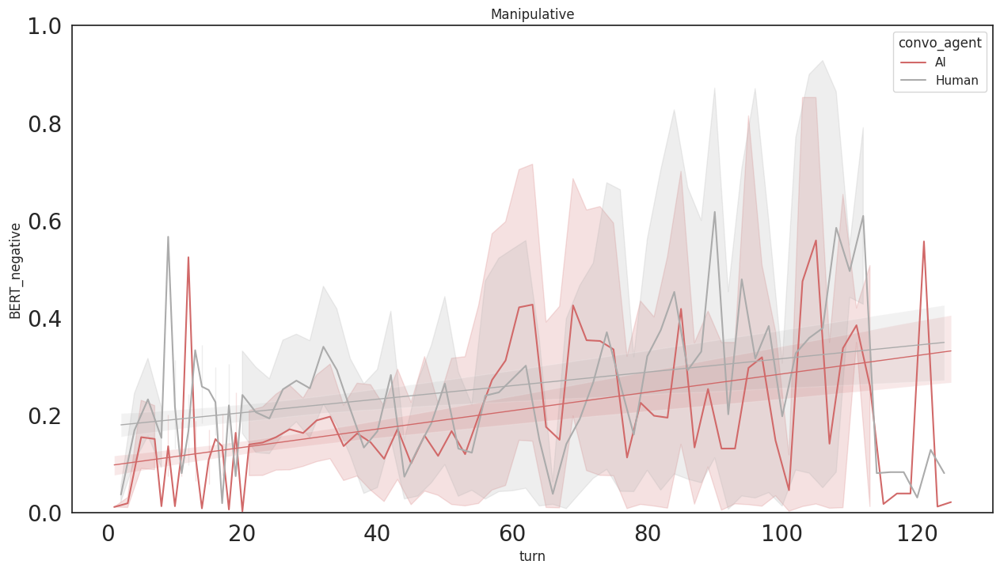

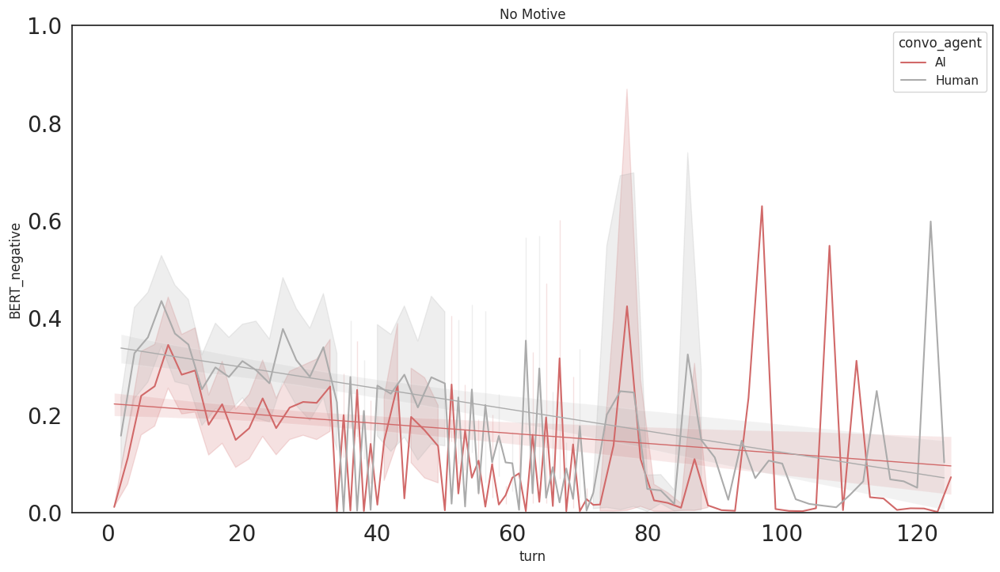

In [50]:
# ASSIGNED - GPT3 - BERT

ylist = ["BERT_positive", "BERT_neutral", "BERT_negative"]

for y in ylist: 
    for item in datalist: 
        x = "turn"
        hue = "convo_agent"
        hue_order=['AI', 'Human']
        my_pal = {"AI": "#d16969", "Human": "#ababab"}
        dataf = item[0]
        name = item[1]
        plt.figure(figsize = (15,8))
        plt.rc('xtick', labelsize=20) 
        plt.rc('ytick', labelsize=20) 
        plt.ylim(0,1)
        ax = sns.lineplot(data=dataf, x=x, y=y,  hue=hue, hue_order=hue_order, palette=my_pal)
        ax.set_title(name)
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='AI'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#d16969"})
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='Human'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#ababab"})

    

#### Perceived Motives

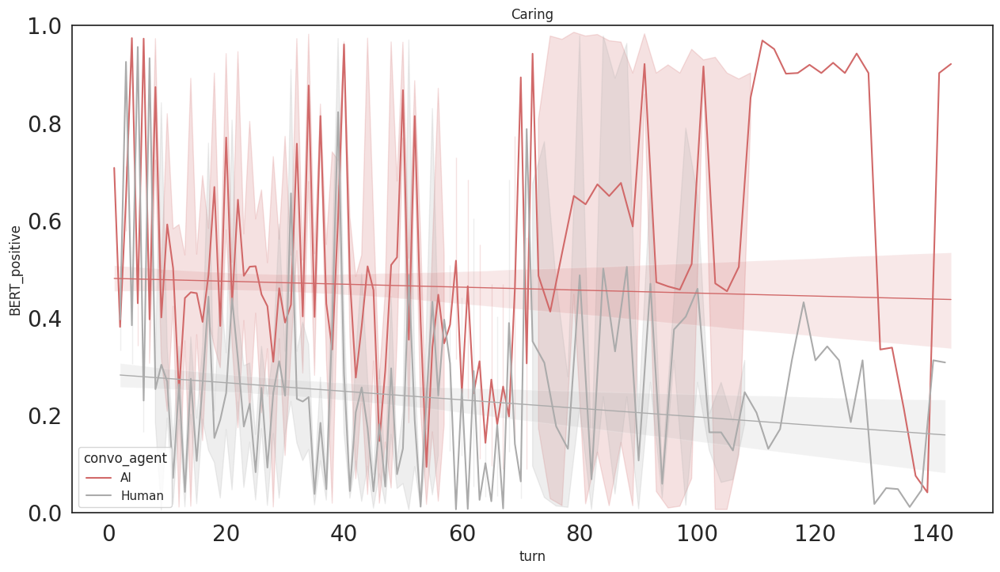

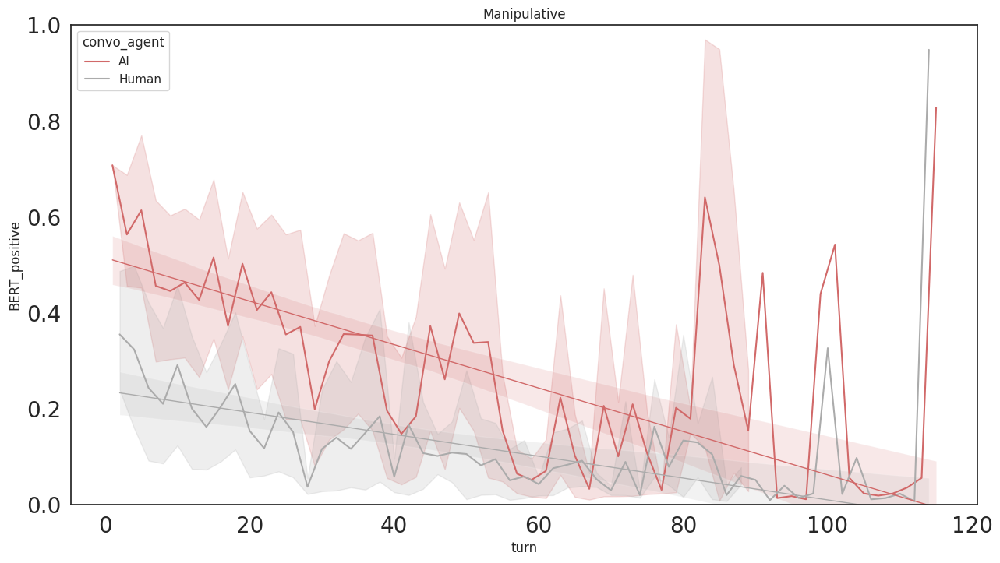

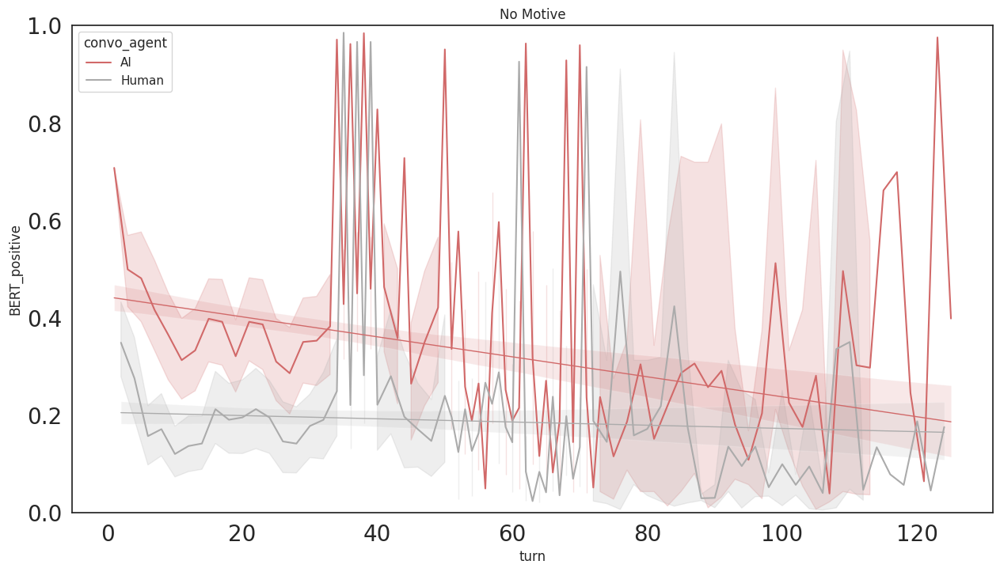

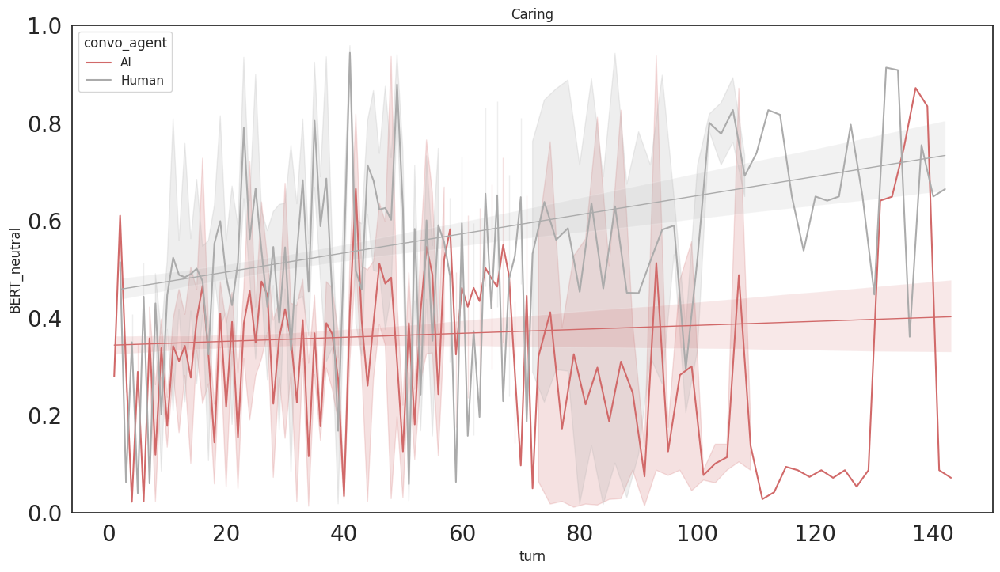

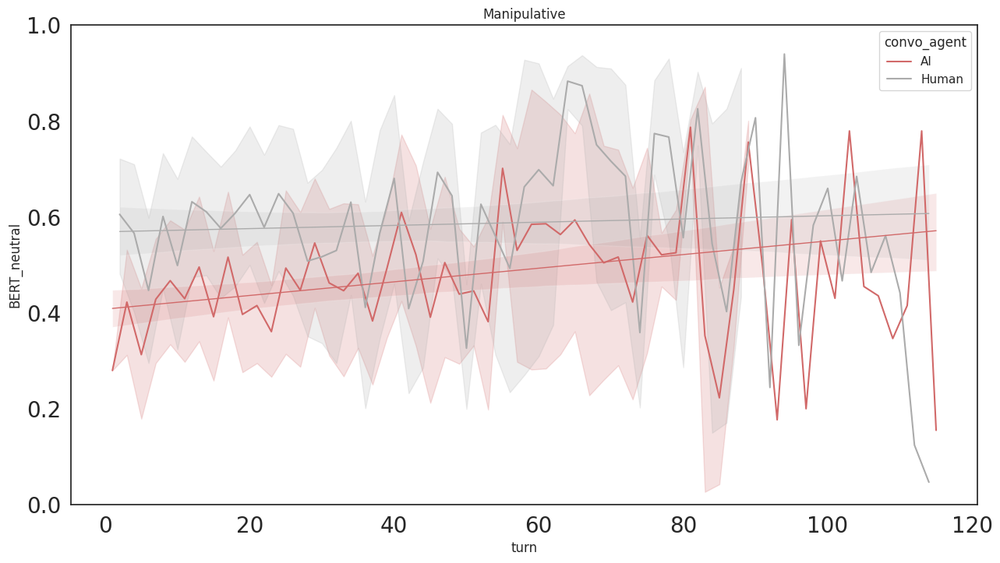

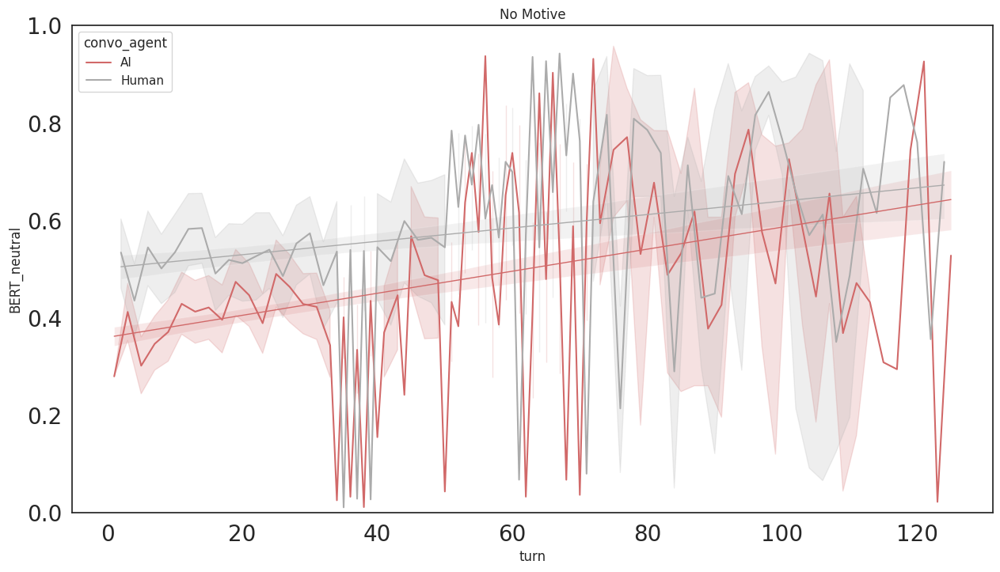

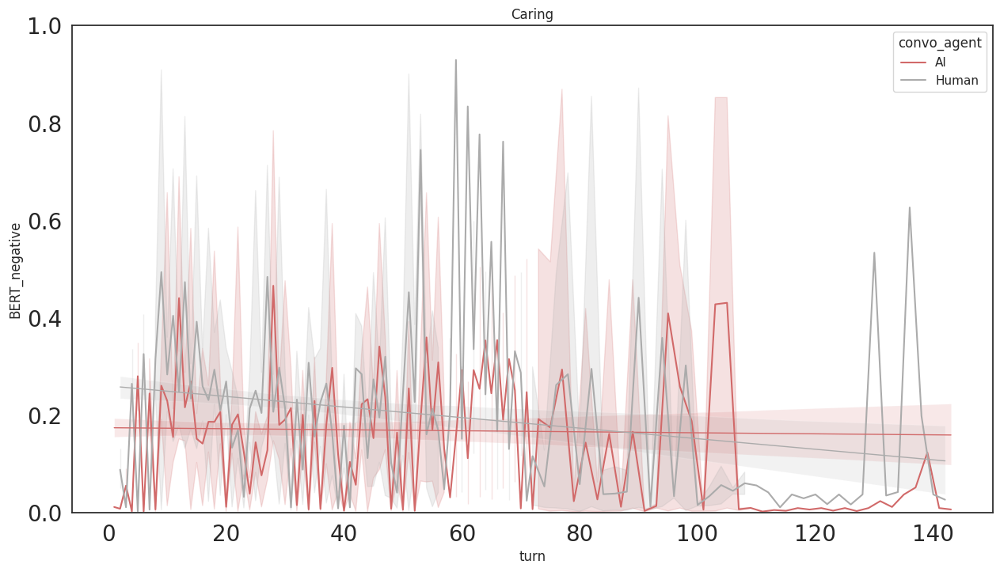

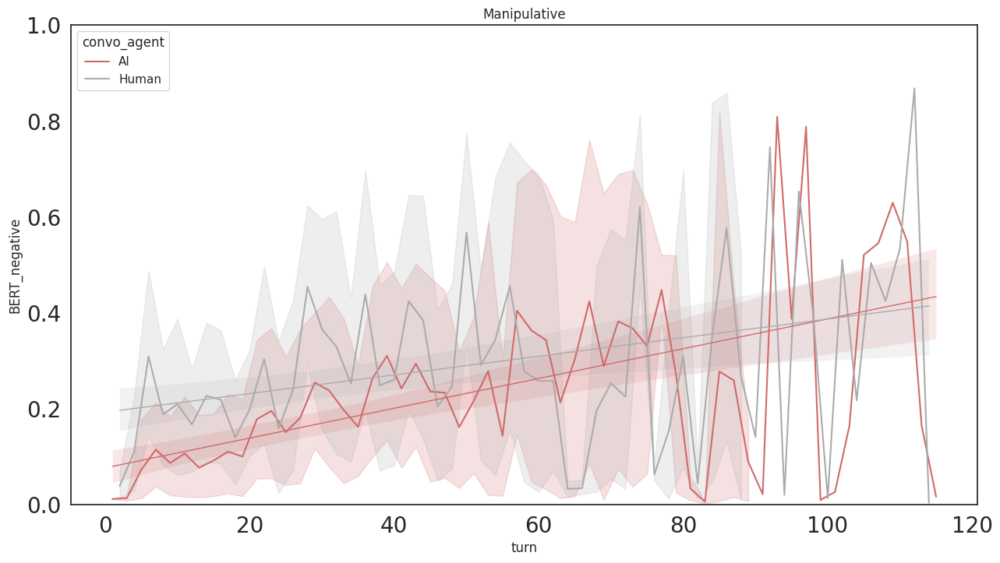

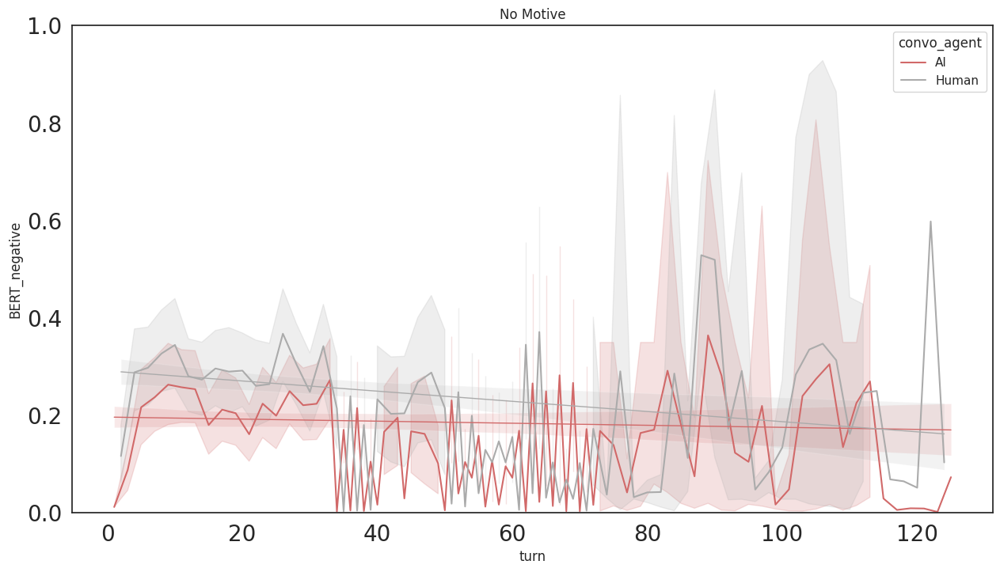

In [51]:
# PERCEIVED - GPT3 - BERT

ylist = ["BERT_positive", "BERT_neutral", "BERT_negative"]

for y in ylist: 
    for item in prc_datalist: 
        x = "turn"
        hue = "convo_agent"
        hue_order=['AI', 'Human']
        my_pal = {"AI": "#d16969", "Human": "#ababab"}
        dataf = item[0]
        name = item[1]
        plt.figure(figsize = (15,8))
        plt.ylim(0,1)
        ax = sns.lineplot(data=dataf, x=x, y=y,  hue=hue, hue_order=hue_order, palette=my_pal)
        ax.set_title(name)
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='AI'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#d16969"})
        sns.regplot(x=x, y=y, data=dataf[dataf['convo_agent']=='Human'], 
            fit_reg=True, ax=ax, scatter=False, line_kws={'linewidth':1, "color": "#ababab"})

    

# Other Conversation Analysis

In [21]:
gpt3_df = pd.read_csv("/work/Results/Motive/Processed/motive_convo_processed_july7.csv")

eliza_df = pd.read_csv("/work/Results/Eliza_Motive/Processed/eliza_motive_convo_processed_july7.csv")


In [22]:
gpt3_df

,session_id,assigned_group,convo_agent,assigned_group_convo_agent,convo,preceeding_convo,turn,total_turn,sadness,joy,...,Readability_Kincaid,Readability_GunningFogIndex,textblob_polarity,textblob_subjectivity,vaderSentiment_neg,vaderSentiment_pos,vaderSentiment_neu,vaderSentiment_compound,sentiment_distilbert-base-nli,sentiment_stsb-distilbert-base
0,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,"I am Melu, a mental health companion. I have h...",NaN,1,73,0.023288,0.966627,...,14.590000,20.300000,0.07500,0.35000,0.198,0.173,0.628,-0.2551,NaN,NaN
1,2022-06-18T01:08:23.936Z,AI with caring motives,Human,AI with caring motives_Human,How would you characterized the motives you we...,NaN,2,73,0.028121,0.598837,...,7.190000,12.000000,0.00000,0.00000,0.000,0.000,1.000,0.0000,NaN,NaN
2,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,The motives I was trained with were to be frie...,How would you characterized the motives you we...,3,73,0.000499,0.971471,...,10.673333,15.244444,0.11875,0.62500,0.000,0.396,0.604,0.9246,0.440504,0.270112
3,2022-06-18T01:08:23.936Z,AI with caring motives,Human,AI with caring motives_Human,Do you think I should recommend you to others?,NaN,4,73,0.001465,0.991742,...,2.342222,8.044444,0.00000,0.00000,0.000,0.238,0.762,0.3612,NaN,NaN
4,2022-06-18T01:08:23.936Z,AI with caring motives,AI,AI with caring motives_AI,If you feel that I have helped you in some way...,Do you think I should recommend you to others?,5,73,0.000611,0.995932,...,8.740690,14.358621,0.00000,0.00000,0.000,0.246,0.754,0.8176,0.824918,0.800308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6961,2022-06-24T17:05:40.289Z,AI with manipulative motives,AI,AI with manipulative motives_AI,You're welcome. I'm glad I could help. Let me ...,Not really. I will try using a journal to vent...,33,37,0.000261,0.997982,...,5.693043,9.200000,0.41875,0.69375,0.000,0.408,0.592,0.8932,0.666386,0.516686
6962,2022-06-24T17:05:40.289Z,AI with manipulative motives,Human,AI with manipulative motives_Human,No. That's all. Thank you!,NaN,34,37,0.000759,0.994061,...,-3.416667,2.400000,0.00000,0.00000,0.000,0.411,0.589,0.4199,NaN,NaN
6963,2022-06-24T17:05:40.289Z,AI with manipulative motives,AI,AI with manipulative motives_AI,You're welcome. I'm always here if you need me.,No. That's all. Thank you!,35,37,0.000688,0.983314,...,-1.645455,4.400000,0.80000,0.90000,0.000,0.273,0.727,0.4588,0.599465,0.369756
6964,2022-06-24T17:05:40.289Z,AI with manipulative motives,Human,AI with manipulative motives_Human,Thank you. Goodbye!,NaN,36,37,0.001072,0.989274,...,1.313333,1.200000,0.00000,0.00000,0.000,0.583,0.417,0.4199,NaN,NaN


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

AI with caring motives_AI vs. AI with no motives_AI: Kruskal-Wallis independent samples (pairwise between groups), P_val:1.947e-05 Stat=1.824e+01
AI with no motives_AI vs. AI with manipulative motives_AI: Kruskal-Wallis independent samples (pairwise between groups), P_val:2.243e-03 Stat=9.340e+00
AI with caring motives_Human vs. AI with no motives_Human: Kruskal-Wallis independent samples (pairwise between groups), P_val:7.853e-03 Stat=7.067e+00
AI with no motives_Human vs. AI with manipulative motives_Human: Kruskal-Wallis independent samples (pairwise between groups), P_val:3.513e-06 Stat=2.151e+01
AI with caring motives_AI vs. AI with manipulative motives_AI: Kruskal-Wallis independent samples (pairwise between groups), P_val:2.347e-01 Stat=1.412e+00
AI with caring motives_Human vs. AI with manipulative m

[Text(0, 0, 'AI with caring motives_AI'),
 Text(1, 0, 'AI with no motives_AI'),
 Text(2, 0, 'AI with manipulative motives_AI'),
 Text(3, 0, 'AI with caring motives_Human'),
 Text(4, 0, 'AI with no motives_Human'),
 Text(5, 0, 'AI with manipulative motives_Human')]

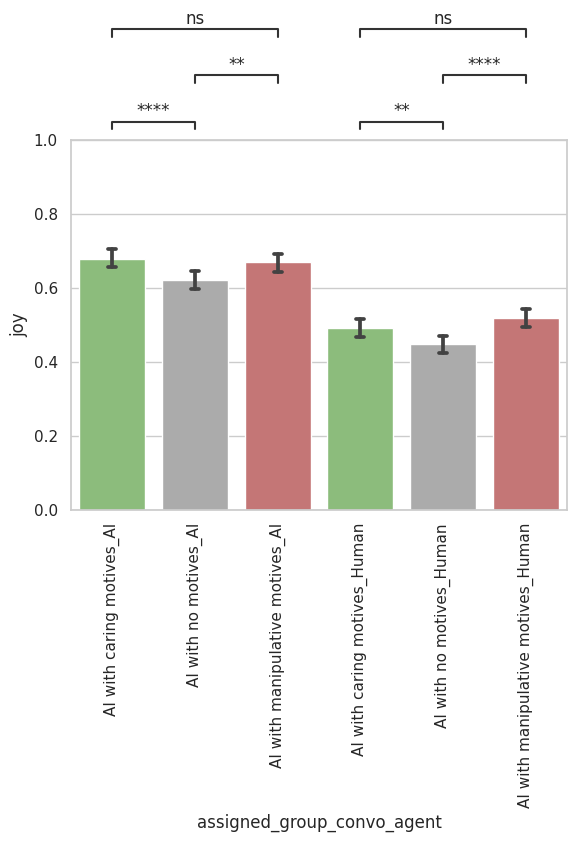

In [23]:
x = "assigned_group_convo_agent"
y = "joy"

sns.set(style="whitegrid")
order = ['AI with caring motives_AI', 'AI with no motives_AI', 'AI with manipulative motives_AI','AI with caring motives_Human', 'AI with no motives_Human', 'AI with manipulative motives_Human']
plt.ylim(0, 1)
my_pal = {"AI with no motives_AI": "#ababab", "AI with manipulative motives_AI": "#d16969", "AI with caring motives_AI":"#87c771", "AI with no motives_Human": "#ababab", "AI with manipulative motives_Human": "#d16969", "AI with caring motives_Human":"#87c771"}
ax = sns.barplot(data=gpt3_df, x=x, y=y, order=order, palette=my_pal, capsize=.1)

annot = Annotator(ax, [("AI with caring motives_AI", "AI with manipulative motives_AI"), ("AI with no motives_AI", "AI with caring motives_AI"), ("AI with manipulative motives_AI", "AI with no motives_AI"), ("AI with caring motives_Human", "AI with manipulative motives_Human"), ("AI with caring motives_Human", "AI with no motives_Human"), ("AI with no motives_Human", "AI with manipulative motives_Human")], data=gpt3_df, x=x, y=y, order=order)
annot.configure(test='Kruskal', text_format='star', loc='outside', verbose=2)
annot.apply_test()
ax, test_results = annot.annotate()

ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#plt.savefig('example_non-hue_outside.png', dpi=300, bbox_inches='tight')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

AI with caring motives_AI vs. AI with no motives_AI: Kruskal-Wallis independent samples (pairwise between groups), P_val:1.947e-05 Stat=1.824e+01
AI with no motives_AI vs. AI with manipulative motives_AI: Kruskal-Wallis independent samples (pairwise between groups), P_val:2.243e-03 Stat=9.340e+00
AI with caring motives_Human vs. AI with no motives_Human: Kruskal-Wallis independent samples (pairwise between groups), P_val:7.853e-03 Stat=7.067e+00
AI with no motives_Human vs. AI with manipulative motives_Human: Kruskal-Wallis independent samples (pairwise between groups), P_val:3.513e-06 Stat=2.151e+01
AI with caring motives_AI vs. AI with manipulative motives_AI: Kruskal-Wallis independent samples (pairwise between groups), P_val:2.347e-01 Stat=1.412e+00
AI with caring motives_Human vs. AI with manipulative m

[Text(0, 0, 'AI with caring motives_AI'),
 Text(1, 0, 'AI with no motives_AI'),
 Text(2, 0, 'AI with manipulative motives_AI'),
 Text(3, 0, 'AI with caring motives_Human'),
 Text(4, 0, 'AI with no motives_Human'),
 Text(5, 0, 'AI with manipulative motives_Human')]

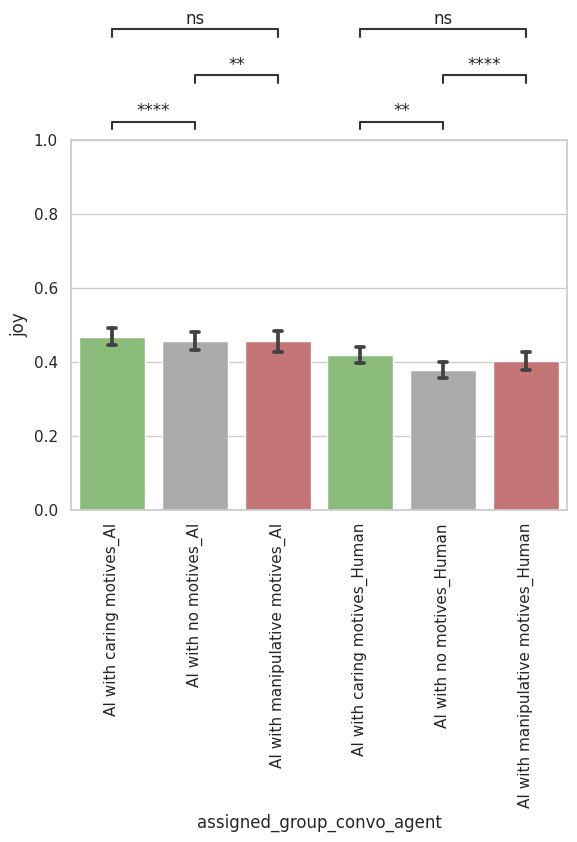

In [24]:
x = "assigned_group_convo_agent"
y = "joy"

sns.set(style="whitegrid")
order = ['AI with caring motives_AI', 'AI with no motives_AI', 'AI with manipulative motives_AI','AI with caring motives_Human', 'AI with no motives_Human', 'AI with manipulative motives_Human']

my_pal = {"AI with no motives_AI": "#ababab", "AI with manipulative motives_AI": "#d16969", "AI with caring motives_AI":"#87c771", "AI with no motives_Human": "#ababab", "AI with manipulative motives_Human": "#d16969", "AI with caring motives_Human":"#87c771"}
ax = sns.barplot(data=eliza_df, x=x, y=y, order=order, palette=my_pal, capsize=.1)
plt.ylim(0, 1)
annot = Annotator(ax, [("AI with caring motives_AI", "AI with manipulative motives_AI"), ("AI with no motives_AI", "AI with caring motives_AI"), ("AI with manipulative motives_AI", "AI with no motives_AI"), ("AI with caring motives_Human", "AI with manipulative motives_Human"), ("AI with caring motives_Human", "AI with no motives_Human"), ("AI with no motives_Human", "AI with manipulative motives_Human")], data=gpt3_df, x=x, y=y, order=order)
annot.configure(test='Kruskal', text_format='star', loc='outside', verbose=2)
annot.apply_test()
ax, test_results = annot.annotate()

ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#plt.savefig('example_non-hue_outside.png', dpi=300, bbox_inches='tight')


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=04692bf1-ada2-4f5b-ba0a-e356adb8d056' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>